In [2276]:
import sys
import numpy as np
from scipy.stats import norm
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from pathlib import Path
from astropy import units as u
from astropy.coordinates import SkyCoord
from regions import CircleSkyRegion, RectangleSkyRegion
from gammapy.maps import WcsGeom, MapAxis, Map, WcsNDMap
from gammapy.makers import MapDatasetMaker, SafeMaskMaker, FoVBackgroundMaker
from gammapy.data import DataStore
from gammapy.datasets import Datasets, FluxPointsDataset, MapDataset
from gammapy.modeling import Fit
from gammapy.modeling.models import SkyModel, LogParabolaSpectralModel, PointSpatialModel, PowerLawSpectralModel, FoVBackgroundModel, Models
from gammapy.estimators import FluxPoints,FluxPointsEstimator, ExcessMapEstimator
%matplotlib inline
import sys, os
import numpy as np
import itertools
import re
import datetime
import gammapy
import time
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import json
from pathlib import Path
from astropy import units as u
from astropy.coordinates import SkyCoord
from gammapy.stats import CashCountsStatistic, cash, cash_sum_cython
from gammapy.maps import WcsGeom, MapAxis, Map
from gammapy.makers import MapDatasetMaker, SafeMaskMaker
from gammapy.data import DataStore, Observations
from gammapy.datasets import Datasets, FluxPointsDataset, MapDatasetOnOff
from gammapy.modeling import Fit
from gammapy.modeling.models import SkyModel, LogParabolaSpectralModel, PointSpatialModel, PowerLawSpectralModel, DiskSpatialModel, TemplateSpatialModel, PowerLawNormSpectralModel
from gammapy.datasets import Datasets, MapDataset
from regions import CircleSkyRegion, RectangleSkyRegion, EllipseSkyRegion
from gammapy.estimators import (
    FluxPoints,
    FluxPointsEstimator,
    EnergyDependentMorphologyEstimator)
# from common_utils import get_excluded_regions
#from gammapy.utils.regions import make_region
from gammapy.modeling.models import FoVBackgroundModel, GaussianSpatialModel, ShellSpatialModel, DiskSpatialModel, PiecewiseNormSpectralModel
from gammapy.makers import FoVBackgroundMaker
from gammapy.estimators import ExcessMapEstimator, TSMapEstimator, FluxMaps
from gammapy.maps import WcsNDMap
from gammapy.visualization import plot_npred_signal, plot_distribution
import ipywidgets
from gammapy.modeling.models import Models
from astropy.coordinates import Angle
from collections import OrderedDict
import glob
import matplotlib.pyplot as plt
import datetime
from scipy.stats import chi2, norm
from astropy.table import Table
import pandas as pd
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=RuntimeWarning)
warnings.filterwarnings('ignore', category=DeprecationWarning)
warnings.filterwarnings('ignore', category=UserWarning)
DB_general = pd.read_csv('/home/wecapstor1/caph/caph101h/projects/test_projects/Run_matching_tutorial/db_data.csv', header=0)
import sys  
sys.path.insert(1, '/home/hpc/caph/mppi103h/Documents/On-OFF-matching-woody')
from scipy.optimize import curve_fit
import common_utils
from common_utils import get_excluded_regions
from matplotlib.lines import Line2D
from PIL import Image
sys.path.insert(1, '/home/wecapstor1/caph/caph101h/projects/test_projects/Run_matching_tutorial')
import my_utility_functions as muf
PlotDir = '/home/wecapstor1/caph/caph101h/projects/test_projects/Run_matching_tutorial/Plots/ON_OFF/Hess_1u/Spectral'

path_norms_and_tilts = '/home/vault/caph/caph101h/datasets/ON_OFF/spectral/HESS1u/bkg_estimation/tilt_and_norm/'
path_fits = '/home/vault/caph/caph101h/datasets/ON_OFF/spectral/HESS1u/bkg_estimation/fits/'

In [2277]:
import sys  
sys.path.insert(2, '/home/wecapstor1/caph/caph101h/projects/test_projects/Run_matching_tutorial/Monogem_on_off_bkg/')

import analysis as util

In [2278]:
from importlib import reload
reload(util)
reload(muf)

<module 'my_utility_functions' from '/home/wecapstor1/caph/caph101h/projects/test_projects/Run_matching_tutorial/my_utility_functions.py'>

In [2279]:
import run_matching_algorithm as rma
reload(rma)

<module 'run_matching_algorithm' from '/home/wecapstor1/caph/caph101h/projects/test_projects/Run_matching_tutorial/run_matching_algorithm.py'>

In [2280]:
muon_phases2 = [20000, 40093, 57532, 60838, 63567, 68545, 80000, 85000, 95003, 100800, 110340, 127700, 128600, 132350, 154814, 190000]

DB_general = pd.read_csv(r'/home/wecapstor1/caph/shared/hess/fits/database_image/data_1223.csv', header=0)
correction_factor = pd.read_csv(r'/home/wecapstor1/caph/caph101h/projects/test_projects/Run_matching_tutorial/zenith_correction_factors.csv', sep='\t')

In [2281]:
offset_max = 2*u.deg

# Define some functions

In [2282]:
def gauss_function(x, a, x0, sigma):
    return a*np.exp(-(x-x0)**2/(2*sigma**2))

def find_energy_threshold(dataset):
    number = 0
    for k in range(0,dataset.counts.data.shape[0]): 
        for l in range(0,dataset.counts.data.shape[1]):
            for n in range(0,dataset.counts.data.shape[2]):
                if dataset.mask_safe.data[k][l][n] == True:
                    number = k 
                    break
        if number != 0:
            break
    return number

def get_exclusion_mask(off_run, geom_off, radius, radius_source_mask):
    """ Define the exclusion mask that will be used for the background fit """ 
    
    hap_exclusion_regions = get_excluded_regions(geom_off.center_coord[0].value, geom_off.center_coord[1].value, radius)
    excl_regions = []
    for source in hap_exclusion_regions:
        center = SkyCoord(source.ra, source.dec, unit='deg', frame='icrs')
        region = CircleSkyRegion(center=center, radius=source.radius*u.deg)
        excl_regions.append(region)

    tel_pointing = off_run.pointing.fixed_icrs
    source_pos = DB_general[DB_general['Run']==off_run.obs_id]
    ra = tel_pointing.ra.value #- source_pos['Offset_x'].iloc[0]
    dec = tel_pointing.dec.value #- source_pos['Offset_y'].iloc[0]
    excl_regions.append(CircleSkyRegion(center=SkyCoord(ra*u.deg, dec*u.deg), radius=radius_source_mask*u.deg))
    
    data2 = geom_off.region_mask(regions=excl_regions, inside=False)
    maker_fov_off = FoVBackgroundMaker(method="fit", exclusion_mask=data2)
    ex = maker_fov_off.exclusion_mask.cutout(off_run.pointing.fixed_icrs, width=2 * offset_max)
    return maker_fov_off, ex

def adjust_energy_threshold(dataset, number):
    """ Apply a predifined save energy to the counts and background of a dataset """
    
    bkg_array = np.zeros_like(dataset.data)
    for a in range(number, bkg_array.shape[0]):
        for b in range(0,dataset.data.shape[1]):
            for c in range(0,dataset.data.shape[2]):
                bkg_array[a][b][c] = dataset.data[a][b][c]
    
    masked_data = WcsNDMap(geom=dataset.geom, data=np.array(bkg_array))
    return masked_data

def livetime_corr(obs, off_run, dataset):
    """ Correct for the differences in deadtime corrected observation time """
    
    livetime_dev = off_run.observation_live_time_duration.value - obs.observation_live_time_duration.value
    counts_per_sec = dataset.background.data/off_run.observation_live_time_duration.value
    factors = counts_per_sec*livetime_dev
    bkg = [x + y for x, y in zip(dataset.background.data, factors)]

    bkg = WcsNDMap(geom=dataset.counts.geom, data=np.array(bkg))
    dataset.background = bkg
    return dataset

    
def zenith_corr(obs, off_run, dataset):
    """ Correct for the differences in zenith angle """
    
    for phase in range(0,len(muon_phases2)-1):
        if obs.obs_id > muon_phases2[phase] and obs.obs_id < muon_phases2[phase+1]:
            factor = correction_factor.x_2.iloc[phase]

    bkg = dataset.background.data
    zenith_off = np.deg2rad(ds_off.obs_table[ds_off.obs_table['OBS_ID']==off_run.obs_id]["ZEN_PNT"])
    zenith_on = np.deg2rad(ds_on.obs_table[ds_on.obs_table['OBS_ID']==obs.obs_id]["ZEN_PNT"])
    bkg = np.array(bkg) * np.cos(zenith_on - zenith_off)**factor
    
    bkg = WcsNDMap(geom=dataset.counts.geom, data=np.array(bkg))
    dataset.background = bkg
    return dataset

def systematics(obs, off_run, dataset, sys):
    """ Get the upper or lower limit of the background rate from the systematic error on the background template and run matching """
    run_dev = self.deviation[self.obs_list.index(obs)]
    bkg = dataset.background.data
    binsz = (self.systematic_shift['run dev'].iloc[1] - self.systematic_shift['run dev'].iloc[0])/2
    for i in range(0,len(self.systematic_shift)):
        if run_dev > self.systematic_shift['run dev'].iloc[i]-binsz and run_dev < self.systematic_shift['run dev'].iloc[i]+binsz:
            index = i
            sys_factor = self.systematic_shift['sys dev error'].iloc[i]
            if sys_factor == 0:
                closest_filled = index - min((index - self.systematic_shift[self.systematic_shift['sys dev'] != 0].index), key=abs)
                sys_factor = self.systematic_shift['sys dev error'].iloc[closest_filled]
        
        elif run_dev < self.systematic_shift['run dev'].iloc[0]:
            sys_factor = self.systematic_shift['sys dev error'].iloc[0]

        elif run_dev > self.systematic_shift['run dev'].iloc[-1]:
            sys_factor = self.systematic_shift['sys dev error'].iloc[-1]
    
    if sys == 'low':
        bkg = [x - x*sys_factor for x in bkg] 
    elif sys == 'high':
        bkg = [x + x*sys_factor for x in bkg]   
    
    bkg = WcsNDMap(geom=dataset.counts.geom, data=np.array(bkg))
    dataset.background = bkg
    return dataset

# Processing the Runlist

## Loading data

In [2283]:
individual_matches = np.loadtxt('/home/vault/caph/caph101h/runlists/monogem/ON_OFF/fit_algorithm/all_filters/generation_1/individual_alignment/last_misses.txt', dtype='float')

In [2284]:
base_dir_none_applied = '/home/vault/caph/caph101h/runlists/monogem/ON_OFF/fit_algorithm/no_filters/'
# At generation 200-202: Only runs with zenith angle <= 40 deg used, duration=0.25, nsb=0.8, muon_eff=0.11, transparency=0.11, trig_rate=0.25, radio=0.25
# At generation 203: Remains, Only runs with zenith angle <= 40 deg used, duration=0.3, nsb=0.8, muon_eff=0.2, transparency=0.2, trig_rate=0.5, radio=0.5

# At generation 204: Only runs with zenith angle <= 40 deg used, duration=0.25, nsb=0.8, muon_eff=0.2, transparency=0.2, trig_rate=0.3, radio=0.3 20/28 runs matched


base_dir_none_applied_below_42_deg = '/home/vault/caph/caph101h/runlists/monogem/ON_OFF/fit_algorithm/no_filters/below_42_deg/'

base_dir_mu_std =  '/home/vault/caph/caph101h/runlists/monogem/ON_OFF/fit_algorithm/only_mu_and_std/'
base_dir_norm_and_tilt =  '/home/vault/caph/caph101h/runlists/monogem/ON_OFF/fit_algorithm/only_norm_and_tilt/'

base_dir_norm_and_tilt_below_42_deg = '/home/vault/caph/caph101h/runlists/monogem/ON_OFF/fit_algorithm/mu_std_norm_tilt/below_42_deg/deviation_less_than_1'

base_dir_mu_std_excess = '/home/vault/caph/caph101h/runlists/monogem/ON_OFF/fit_algorithm/mu_std_excess/'
base_dir_mu_std_excess_deviation = '/home/vault/caph/caph101h/runlists/monogem/ON_OFF/fit_algorithm/mu_std_excess_deviation/'

base_dir_mu_std_norm_tilt = '/home/vault/caph/caph101h/runlists/monogem/ON_OFF/fit_algorithm/mu_std_norm_tilt/'
# Generation 0-20: 52 runs; older values, so between -0.15-0.15 and 0.85 to 1.15
# Generation 150-200: newer approach

base_dir_mu_std_norm_tilt_below_42_deg = '/home/vault/caph/caph101h/runlists/monogem/ON_OFF/fit_algorithm/mu_std_norm_tilt/below_42_deg/'

base_dir_mu_std_norm_tilt_excess = '/home/vault/caph/caph101h/runlists/monogem/ON_OFF/fit_algorithm/mu_std_norm_tilt_excess/'
# Generation 100 - 120: have lower ON run excess at -75
# Generation 121 - 150: have lower ON run excess at -75 and upper excess at 1000

base_dir_mu_std_norm_tilt_excess_counts_diff = '/home/vault/caph/caph101h/runlists/monogem/ON_OFF/fit_algorithm/mu_std_norm_tilt_total_pred_counts_diff'
# Generation 150 - 159: counts diff at 0.1 
# at generation 150-153: mu_lower=-.125, mu_upper=.125, std_lower=.875, std_upper=1.125,  tilt_lower=-.125, tilt_upper=-.125, norm_lower=.875, norm_upper=1.125, run_difference_param=0.1
# also at generation 150-153: duration=0.75, nsb=0.9, muon_eff=0.75, transparency=0.75, trig_rate=0.75, radio=0.75

# Generation 155: mu_lower=-.25, mu_upper=.25, std_lower=.75, std_upper=1.25, tilt_lower=-.25, tilt_upper=.25, norm_lower=.75, norm_upper=1.25, excess_lower=-20000, excess_upper=20000, run_difference_param=0.1
#   double off runs allowed, also no changes in parameters

# Generation 156: mu_lower=-.25, mu_upper=.25, std_lower=.75, std_upper=1.25, tilt_lower=-.25, tilt_upper=.25, norm_lower=.75, norm_upper=1.25, excess_lower=-20000, excess_upper=20000, run_difference_param=0.1
#   double off runs allowed, also no changes in parameters

base_dir_mu_std_excess_deviation_tilt_norm = '/home/vault/caph/caph101h/runlists/monogem/ON_OFF/fit_algorithm/mu_std_excess_deviation_tilt_norm/'
base_dir_all_applied = '/home/vault/caph/caph101h/runlists/monogem/ON_OFF/fit_algorithm/all_filters/'

bases = [base_dir_mu_std_norm_tilt_below_42_deg]

on_runs_initial, off_runs_initial, deviation_initial = rma.load_run_base(base_dirs=bases, generation_prefix_range=(0,10), iteration_range= (0, 500))
#on_runs_addition, off_runs_addition, deviation_addition = rma.load_run_base(base_dirs=bases, generation_prefix_range=(150,200), iteration_range= (0, 20))
#on_runs_addition_1, off_runs_addition_1, deviation_addition_1 = rma.load_run_base(base_dirs=bases, generation_prefix_range=(30, 40), iteration_range= (0, 20))

affected_runs_path = '/home/vault/caph/caph101h/runlists/affected_runs/affected_runs.txt'
affected_runs = np.loadtxt(affected_runs_path, usecols=(0,), dtype=float)

affected_mask_on = np.isin(affected_runs, on_runs_initial)
affected_mask_off = np.isin(affected_runs, off_runs_initial)

# Find indices of affected runs
affected_indices_on = np.where(affected_mask_on)[0]
affected_indices_off = np.where(affected_mask_off)[0]

# Print results in a nicer format
if affected_indices_on.ndim == 0:
    affected_indices_on = np.array([affected_indices_on])

if affected_indices_off.ndim == 0:
    affected_indices_off = np.array([affected_indices_off])

if affected_indices_off.size == 0:
    print('Check for affected Off runs: No affected Off runs found.')
else:
    print(f'Check for affected Off runs: Affected Off runs found at indices {affected_indices_off}.')

if affected_indices_on.size == 0:
    print('Check for affected On runs: No affected On runs found.')
else:
    print(f'Check for affected On runs: Affected On runs found at indices {affected_indices_on}.')

24 runs contained
Check for affected Off runs: No affected Off runs found.
Check for affected On runs: No affected On runs found.


In [2285]:
#On 165394, Off 166897
on_runs_initial[np.where(off_runs_initial == 166897)]

array([165193., 165232.])

In [2286]:
# on_runs_initial = on_runs_initial[np.where(~np.isin(on_runs_initial, on_runs_addition_1))]
# off_runs_initial = off_runs_initial[np.where(~np.isin(on_runs_initial, on_runs_addition_1))]
# deviation_initial = deviation_initial[np.where(~np.isin(on_runs_initial, on_runs_addition_1))]

# on_runs_addition = on_runs_addition[np.where(~np.isin(on_runs_addition, on_runs_addition_1))]
# off_runs_addition = off_runs_addition[np.where(~np.isin(on_runs_addition, on_runs_addition_1))]
# deviation_addition = deviation_addition[np.where(~np.isin(on_runs_addition, on_runs_addition_1))]

In [2287]:
# on_runs_initial, off_runs_initial, deviation_initial = rma.load_run_base(base_dirs=bases, generation_prefix_range=(50,55), iteration_range= (0, 20))
# on_runs_addition, off_runs_addition, deviation_addition = rma.load_run_base(base_dirs=bases, generation_prefix_range=(56,60), iteration_range= (0, 20))

# on_runs_addition_1, off_runs_addition_1, deviation_addition_1 = rma.load_run_base(base_dirs=bases, generation_prefix_range=(61, 65), iteration_range= (0, 20))
# # on_runs_addition_2, off_runs_addition_2, deviation_addition_2 = rma.load_run_base(base_dirs=bases, generation_prefix_range=(30, 40), iteration_range= (0, 20))

In [2288]:
observations_top = np.array([165933, 165427, 165429, 165193, 165963, 165197, 165199, 180044, 165201, 165746, 172155, 171652, 165810, 165302, 165305, 165310, 165871]) # Generation 50-60
observations_left = np.array([165905, 165164, 165166, 165423, 165168, 165425, 165170, 171589, 180043, 165966, 165749, 172156, 165276, 165278, 165842, 165874]) # Generation 61-70
observations_right = np.array([165902, 165394, 165395, 172067, 165936, 172090, 172093, 180046, 171611, 165236, 165240, 165242, 165244, 172200, 165807, 165306, 165308, 165839]) # Generation 71-80
observations_bottom = np.array([165907, 165398, 165400, 165203, 165205, 171631, 165232, 165750, 172154, 165268, 165271, 165272, 165274, 165811, 165876]) # Generation 81-90

In [2289]:
on_runs = np.concatenate((on_runs_initial,
                          #on_runs_addition,
                          #on_runs_addition_1,
                         ))
off_runs = np.concatenate((off_runs_initial, 
                           #off_runs_addition,
                           #off_runs_addition_1,
                          ))
deviation = np.concatenate((deviation_initial,
                            #deviation_addition, 
                            #deviation_addition_1,
                           ))


# on_runs = on_runs[np.where(~np.isin(off_runs, repeated_occurences_array))]
# off_runs = off_runs[np.where(~np.isin(off_runs, repeated_occurences_array))]
# deviation = deviation[np.where(~np.isin(off_runs, repeated_occurences_array))]

# on_runs = on_runs_initial
# off_runs = off_runs_initial
# deviation = deviation_initial

print(f'{len(on_runs)} On runs total')
print(f'{len(off_runs)} Off runs total')
print(f'{len(deviation)} Deviations total')
print('\n')

repeated_occurences_array = off_runs[muf.find_indices_of_repeated_values(off_runs)]

occurrences = {}
repeated_counts = {}

for num in repeated_occurences_array:
    if num in occurrences:
        occurrences[num] += 1
        repeated_counts[num] += 1
    else:
        occurrences[num] = 1
        repeated_counts[num] = 0

# Sum the values in the repeated_counts dictionary
total_repeats = sum(repeated_counts.values())

print(f'{len(muf.find_indices_of_repeated_values(on_runs))} On runs are repeated')
print(f'{total_repeats} Off runs are repeated')
print(f'{len(muf.compare_arrays(on_runs,off_runs))} Off runs that are identical to On runs')

24 On runs total
24 Off runs total
24 Deviations total


0 On runs are repeated
6 Off runs are repeated
0 Off runs that are identical to On runs


In [2290]:
# on_runs =  on_runs[np.where(~np.isin(off_runs, repeated_occurences_array))]
# off_runs = off_runs[np.where(~np.isin(off_runs, repeated_occurences_array))]
# deviation =  deviation[np.where(~np.isin(off_runs, repeated_occurences_array))]

In [2291]:
all_on_runs = np.loadtxt('/home/vault/caph/caph101h/runlists/monogem/ON_OFF/runlists_monogem_Hess_1u_spectral.txt', usecols=(0,) , dtype=float)
on_runs_below_42_deg = np.array([165164, 165166, 165168, 165193, 165197, 165199, 165232, 165236, 165268, 165271, 165272, 165274, 
                                 165302, 165306, 165305, 165395, 165398, 165394, 165423, 165425, 172067, 172090, 172154, 172155, 
                                 172156, 172200, 180043, 180044])

remaining_on_runs = muf.find_non_matching_values(on_runs, on_runs_below_42_deg)
print(f'{len(remaining_on_runs)} runs remain unmatched: {remaining_on_runs}')
print('\n')
print(f'Off runs used: {off_runs.tolist()}')

4 runs remain unmatched: [180043, 165268, 165302, 180044]


Off runs used: [170316.0, 169010.0, 171694.0, 166897.0, 171693.0, 173961.0, 166897.0, 173961.0, 173825.0, 168578.0, 170289.0, 170290.0, 183243.0, 169641.0, 183499.0, 169010.0, 183499.0, 170289.0, 171090.0, 170390.0, 170226.0, 170390.0, 165949.0, 170389.0]


In [2292]:
basedir_off_runs = '/home/wecapstor1/caph/shared/hess/fits/fits_flashcam_stereo/OFFruns/out'
basedir_on_runs = '/home/wecapstor1/caph/shared/hess/fits/fits_flashcam_stereo/Monogem/out/'

# Load DataStores
ds_off = DataStore.from_dir(basedir_off_runs,
                            'hdu-index-bg-3d-v07b-fov-radec.fits.gz',
                            'obs-index-bg-3d-v07b-fov-radec.fits.gz')

ds_on = DataStore.from_dir(basedir_on_runs,
                           'hdu-index-bg-3d-v07b-fov-radec.fits.gz',
                           'obs-index-bg-3d-v07b-fov-radec.fits.gz')

obs_list_on = ds_on.get_observations(on_runs)
obs_list_off = ds_off.get_observations(off_runs)

print(f'{len(obs_list_on)} runs in the On observation list')
print(f'{len(obs_list_off)} runs in the Off observation list')
print(f'{len(deviation)} fractional run deviations. Mean value {round(np.mean(deviation),3)}')

24 runs in the On observation list
24 runs in the Off observation list
24 fractional run deviations. Mean value 0.65


## Coordinates & Histograms

In [2293]:
unique_coords = set()  # Store unique (ra, dec) pairs

for obs in obs_list_on:
    ra = round(obs.pointing.fixed_icrs.ra.value, 4)
    dec = round(obs.pointing.fixed_icrs.dec.value, 4)
    unique_coords.add((ra, dec))

print(unique_coords)

{(104.95, 15.9386), (104.95, 12.5386), (106.55, 14.2386), (103.35, 14.2386)}


In [2294]:
unique_coords = set()  # Store unique (ra, dec) pairs

for obs in obs_list_off:
    ra = round(obs.pointing.fixed_icrs.ra.value, 4)
    dec = round(obs.pointing.fixed_icrs.dec.value, 4)
    unique_coords.add((ra, dec))

print(unique_coords)

{(68.9994, 5.3542), (229.7083, 11.6761), (267.5548, -7.2079), (228.717, -9.1), (68.2962, 4.6542), (209.1858, 10.6842), (349.981, -18.542), (67.5932, 5.3542), (114.539, 17.207), (137.373, -16.8018), (228.2106, -9.6), (269.0299, -1.4399), (68.2962, 6.0542), (115.039, 17.707)}


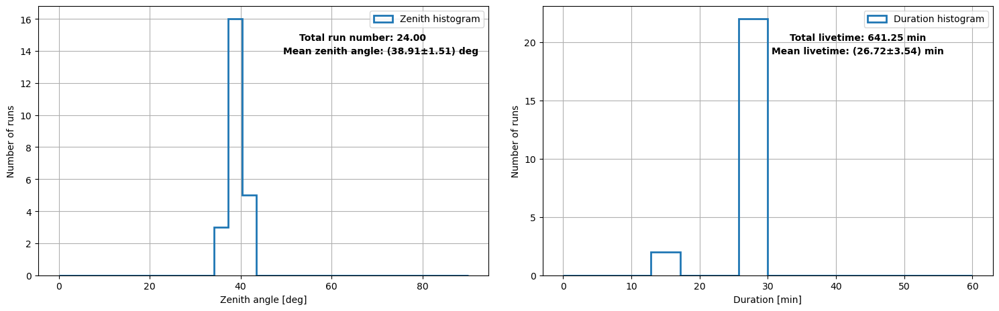

In [2295]:
indices = np.where(np.isin(ds_on.obs_table['OBS_ID'], on_runs))
zenith_angles = ds_on.obs_table['ZEN_PNT'][indices]
livetime = ds_on.obs_table['LIVETIME'][indices] / 60

mean_zenith_angle = np.mean(zenith_angles)
std_zenith_angle =  np.std(zenith_angles)
total_livetime = np.sum(livetime)
run_num = len(obs_list_on)
mean_livetime = np.mean(livetime)
std_livetime = np.std(livetime)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
ax1.hist(zenith_angles, bins=np.linspace(0, 90, 30), histtype='step', lw=2, label = 'Zenith histogram')
ax1.set_xlabel('Zenith angle [deg]')
ax1.set_ylabel('Number of runs')
ax1.text(.72, 0.9, f'Total run number: {run_num:.2f}', ha='center', va='top', transform=ax1.transAxes,
        fontsize=10, color='black', fontweight='bold')
ax1.text(.76, 0.85, f'Mean zenith angle: ({mean_zenith_angle:.2f}±{std_zenith_angle:.2f}) deg', ha='center', va='top', transform=ax1.transAxes,
        fontsize=10, color='black', fontweight='bold')
ax1.grid()
ax1.legend()

ax2.hist(livetime, bins=np.linspace(0, 60, 15), histtype='step', lw=2, label = 'Duration histogram')
ax2.text(.7, 0.9, f'Total livetime: {total_livetime:.2f} min', ha='center', va='top', transform=ax2.transAxes,
        fontsize=10, color='black', fontweight='bold')
ax2.text(.7, 0.85, f'Mean livetime: ({mean_livetime:.2f}±{std_livetime:.2f}) min', ha='center', va='top', transform=ax2.transAxes,
       fontsize=10, color='black', fontweight='bold')
ax2.set_xlabel('Duration [min]')
ax2.set_ylabel('Number of runs')
ax2.grid()
ax2.legend()

plt.tight_layout(rect=[0, 0, 1, 0.95])
# name = 'run_matching_hess_1u_on_runs_zenith_and_livetime_histogram'
# muf.save_figures(PlotDir,name)
plt.show()

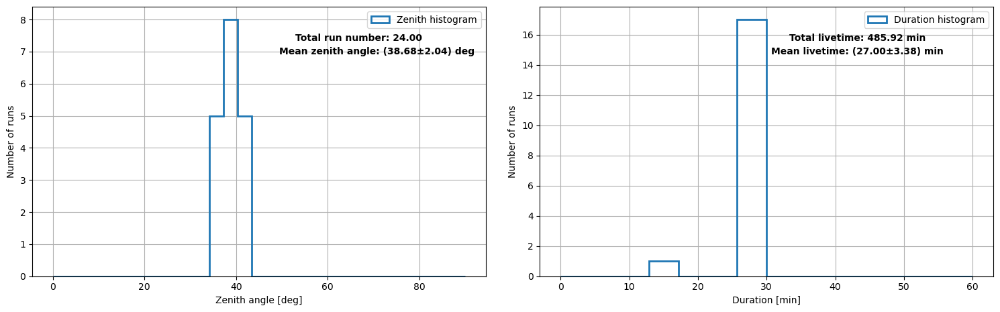

In [2297]:
indices = np.where(np.isin(ds_off.obs_table['OBS_ID'], off_runs_initial))
zenith_angles = ds_off.obs_table['ZEN_PNT'][indices]
livetime = ds_off.obs_table['LIVETIME'][indices] / 60

mean_zenith_angle = np.mean(zenith_angles)
std_zenith_angle =  np.std(zenith_angles)
total_livetime = np.sum(livetime)
run_num = len(obs_list_off)
mean_livetime = np.mean(livetime)
std_livetime = np.std(livetime)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
ax1.hist(zenith_angles, bins=np.linspace(0, 90, 30), histtype='step', lw=2, label = 'Zenith histogram')
ax1.set_xlabel('Zenith angle [deg]')
ax1.set_ylabel('Number of runs')
ax1.text(.72, 0.9, f'Total run number: {run_num:.2f}', ha='center', va='top', transform=ax1.transAxes,
        fontsize=10, color='black', fontweight='bold')
ax1.text(.76, 0.85, f'Mean zenith angle: ({mean_zenith_angle:.2f}±{std_zenith_angle:.2f}) deg', ha='center', va='top', transform=ax1.transAxes,
        fontsize=10, color='black', fontweight='bold')
ax1.grid()
ax1.legend()

ax2.hist(livetime, bins=np.linspace(0, 60, 15), histtype='step', lw=2, label = 'Duration histogram')
ax2.text(.7, 0.9, f'Total livetime: {total_livetime:.2f} min', ha='center', va='top', transform=ax2.transAxes,
        fontsize=10, color='black', fontweight='bold')
ax2.text(.7, 0.85, f'Mean livetime: ({mean_livetime:.2f}±{std_livetime:.2f}) min', ha='center', va='top', transform=ax2.transAxes,
       fontsize=10, color='black', fontweight='bold')
ax2.set_xlabel('Duration [min]')
ax2.set_ylabel('Number of runs')
ax2.grid()
ax2.legend()

plt.tight_layout(rect=[0, 0, 1, 0.95])
# name = 'run_matching_hess_1u_off_runs_zenith_and_livetime_histogram'
# muf.save_figures(PlotDir,name)
plt.show()

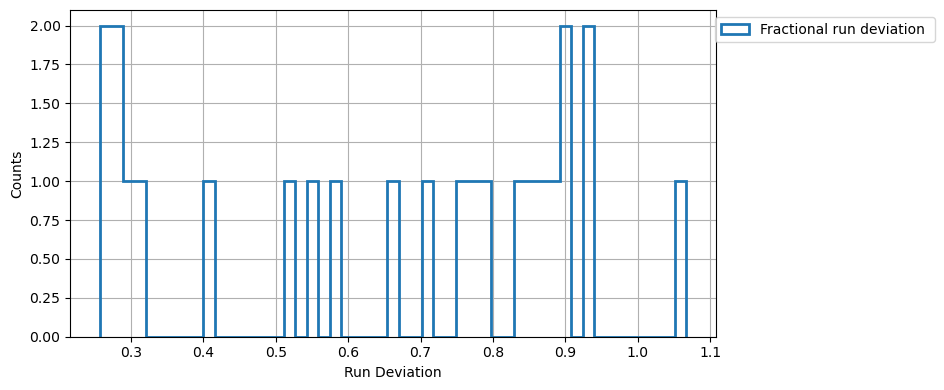

In [2298]:
fig, ax = plt.subplots(1, 1, figsize=(10, 4))
plt.hist(deviation, bins=51, label = 'Fractional run deviation ', histtype='step', lw=2)
plt.xlabel('Run Deviation')
plt.ylabel('Counts')
plt.legend(bbox_to_anchor=(1.35,1))
plt.grid()
plt.tight_layout()
plt.show()

## Create the dataset

In [2299]:
ra_obj = 105.12
dec_obj = 14.32
target = SkyCoord(ra_obj, dec_obj, frame='icrs', unit='deg')

e_reco = np.logspace(-1, 2, 25) * u.TeV 
e_true = np.logspace(-1, 2, 50) * u.TeV 

energy_axis = MapAxis.from_edges(e_reco, unit='TeV', name='energy', interp='log')
energy_axis_true = MapAxis.from_edges(e_true, unit='TeV', name="energy_true", interp='log')

FoV_width = (8, 8)
geom = WcsGeom.create(
    skydir=(ra_obj, dec_obj),
    binsz=0.02,
    width=FoV_width,
    frame="icrs",
    proj="CAR",
    axes=[energy_axis])

In [2300]:
maker = MapDatasetMaker()
maker_safe_mask2 = SafeMaskMaker(methods=["offset-max", 'aeff-default', 'aeff-max', 'edisp-bias', 'bkg-peak'],
                                 offset_max=offset_max,
                                 bias_percent=10,
                                )

### Stacked Dataset

24 runs to analyse!
1 of 24 runs to analyse


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


Predicted to Total Counts Difference: 1.51 %
Counts/pixel for ON ID 165164: 7.88
Counts/pixel for OFF ID 170316: 7.36
Fractional run deviation 0.71


OFF ID: 170316, mu: -0.12, std: 1.03, excess: 2.37
ON ID: 165164, mu: -0.14, std: 1.02, excess: -19.13


Norm: 1.13, Tilt: 0.022
R.A.: 106.55 deg, Dec: 14.24 deg


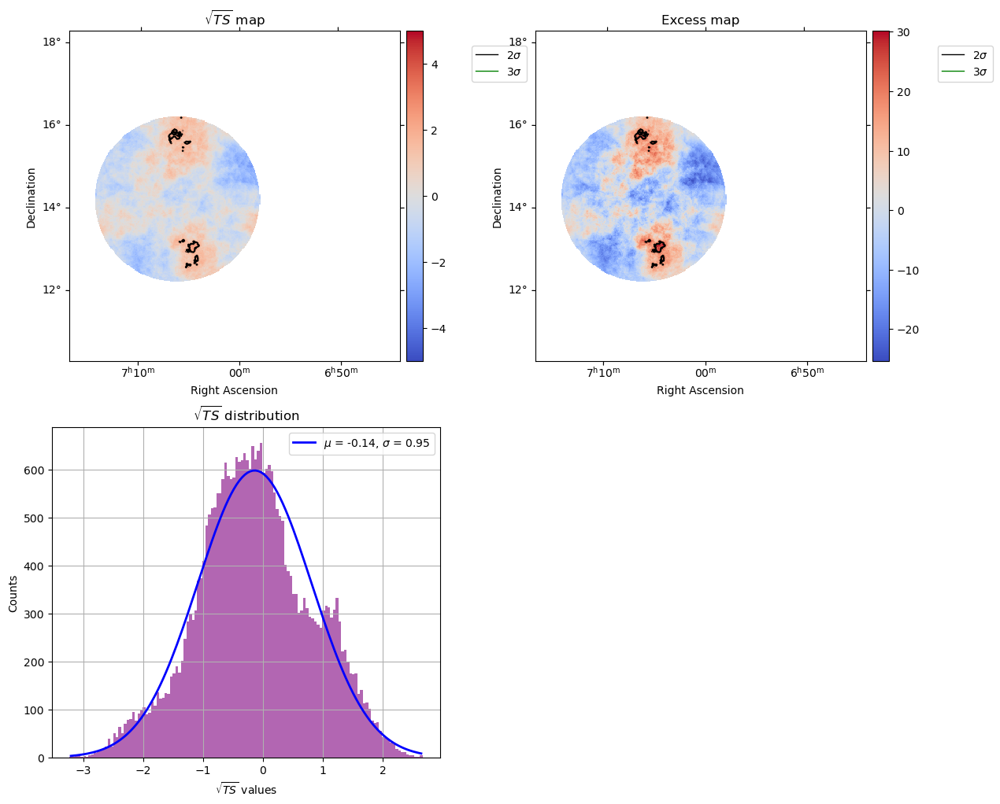

2 of 24 runs to analyse


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


Predicted to Total Counts Difference: 15.39 %
Counts/pixel for ON ID 165166: 7.94
Counts/pixel for OFF ID 169010: 8.87
Fractional run deviation 0.55


OFF ID: 169010, mu: -0.1, std: 1.03, excess: 4.02
ON ID: 165166, mu: -0.41, std: 1.04, excess: -228.18


Norm: 1.275, Tilt: 0.041
R.A.: 106.55 deg, Dec: 14.24 deg


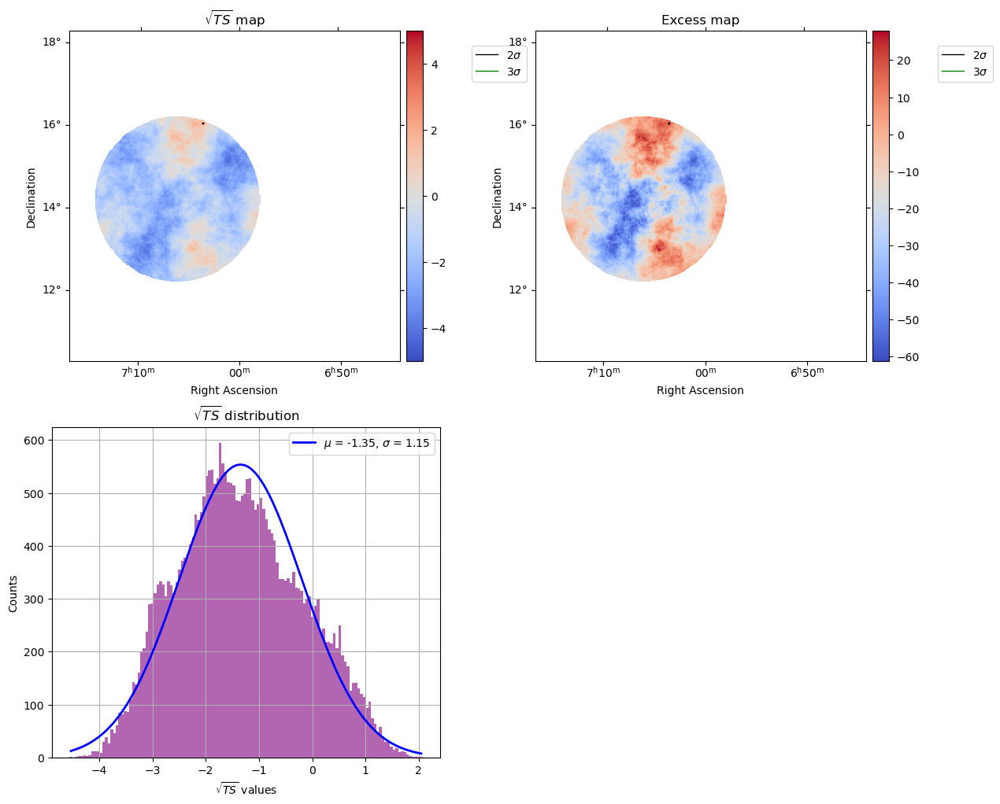

3 of 24 runs to analyse


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


Predicted to Total Counts Difference: 12.7 %
Counts/pixel for ON ID 165168: 3.12
Counts/pixel for OFF ID 171694: 2.84
Fractional run deviation 0.85


OFF ID: 171694, mu: -0.18, std: 1.05, excess: -0.19
ON ID: 165168, mu: -0.04, std: 1.11, excess: 72.82


Norm: 1.186, Tilt: 0.071
R.A.: 106.55 deg, Dec: 14.24 deg


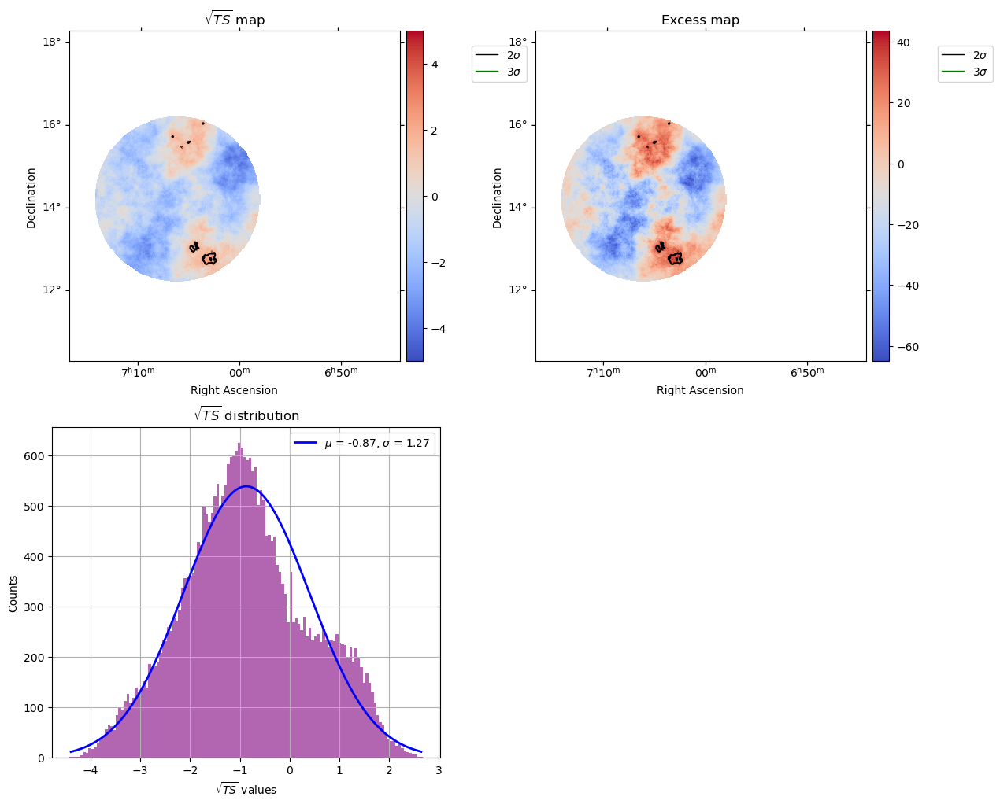

4 of 24 runs to analyse


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


Predicted to Total Counts Difference: 24.78 %
Counts/pixel for ON ID 165193: 5.19
Counts/pixel for OFF ID 166897: 3.93
Fractional run deviation 0.58


OFF ID: 166897, mu: -0.17, std: 1.04, excess: -4.03
ON ID: 165193, mu: 0.14, std: 1.11, excess: 161.24


Norm: 1.238, Tilt: 0.001
R.A.: 104.95 deg, Dec: 15.94 deg


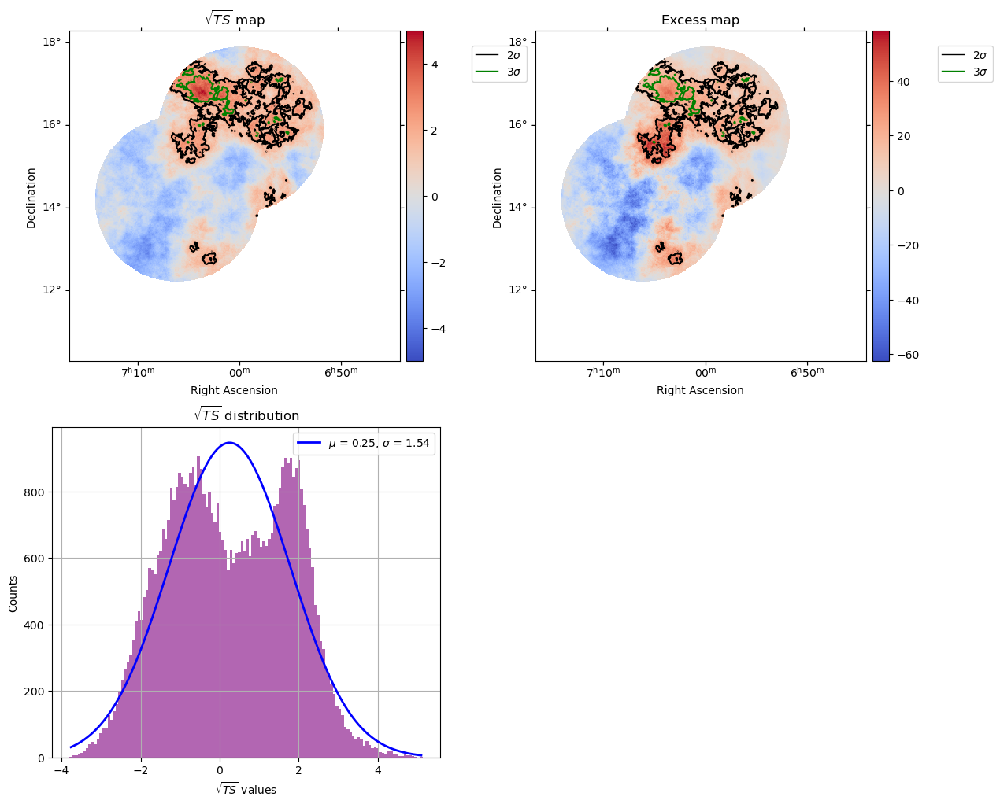

5 of 24 runs to analyse


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


Predicted to Total Counts Difference: 0.02 %
Counts/pixel for ON ID 165197: 2.6
Counts/pixel for OFF ID 171693: 2.73
Fractional run deviation 0.9


OFF ID: 171693, mu: -0.16, std: 1.06, excess: 15.15
ON ID: 165197, mu: -0.21, std: 1.08, excess: 0.12


Norm: 1.097, Tilt: 0.025
R.A.: 104.95 deg, Dec: 15.94 deg


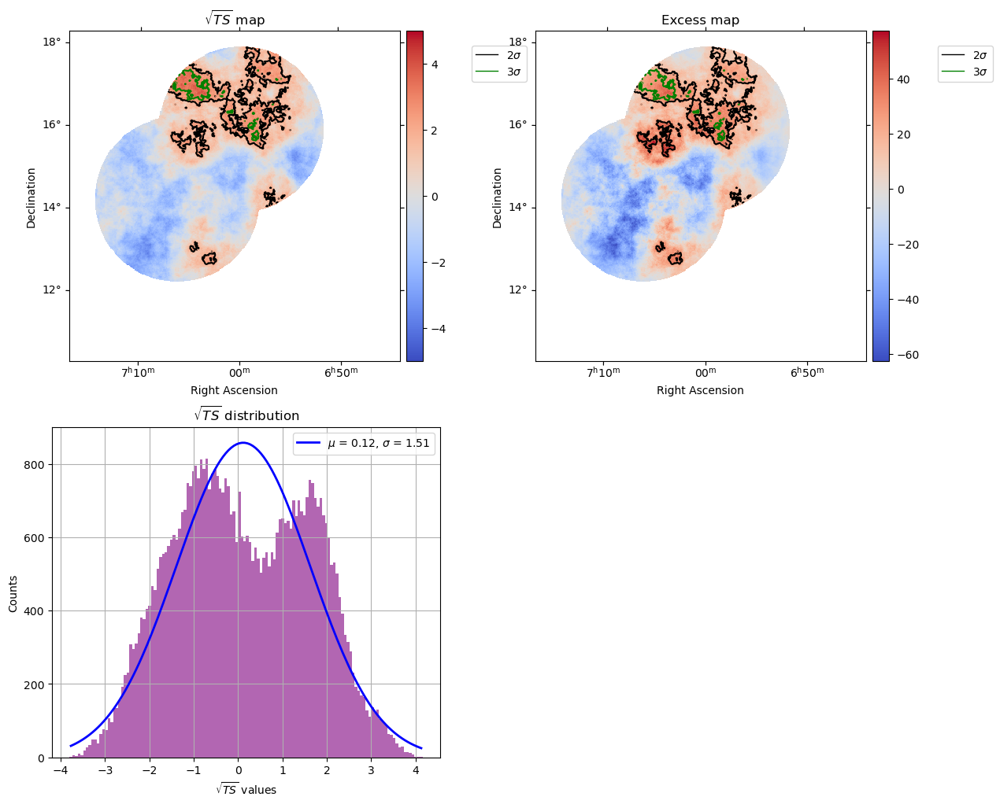

6 of 24 runs to analyse


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


Predicted to Total Counts Difference: 6.41 %
Counts/pixel for ON ID 165199: 2.9
Counts/pixel for OFF ID 173961: 2.49
Fractional run deviation 0.9


OFF ID: 173961, mu: -0.19, std: 1.06, excess: 0.43
ON ID: 165199, mu: -0.11, std: 1.08, excess: 34.77


Norm: 1.033, Tilt: -0.041
R.A.: 104.95 deg, Dec: 15.94 deg


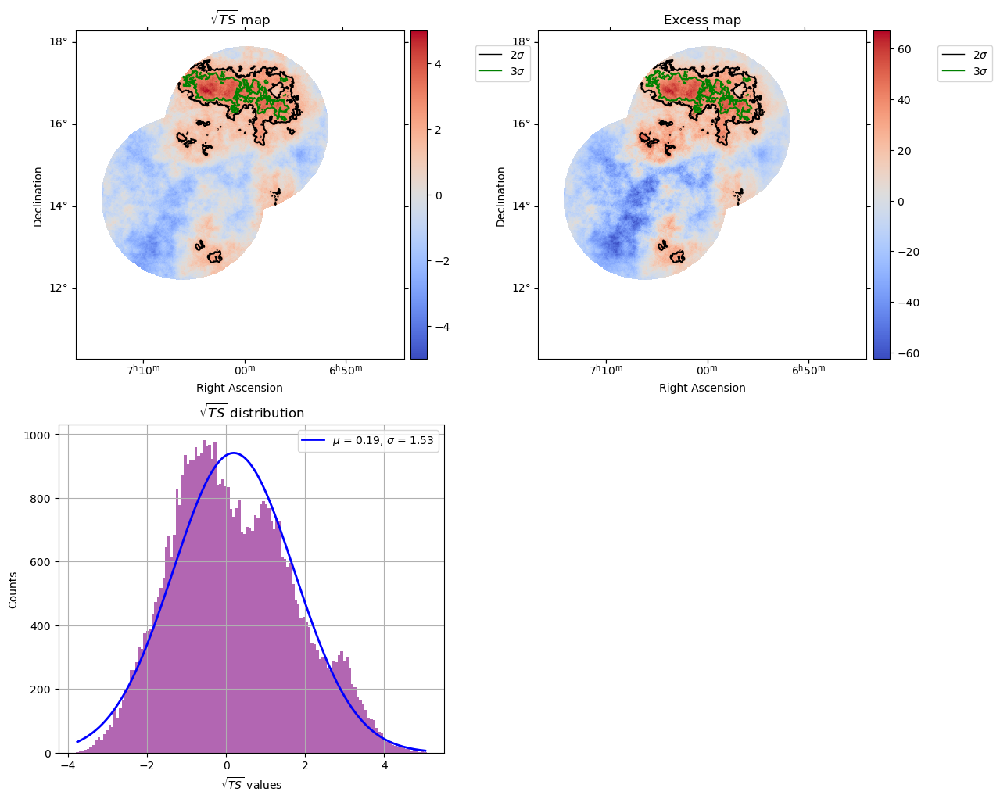

7 of 24 runs to analyse


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


Predicted to Total Counts Difference: 5.34 %
Counts/pixel for ON ID 165232: 4.01
Counts/pixel for OFF ID 166897: 3.93
Fractional run deviation 0.42


OFF ID: 166897, mu: -0.17, std: 1.04, excess: -4.03
ON ID: 165232, mu: -0.23, std: 1.02, excess: -35.28


Norm: 1.238, Tilt: 0.001
R.A.: 104.95 deg, Dec: 12.54 deg


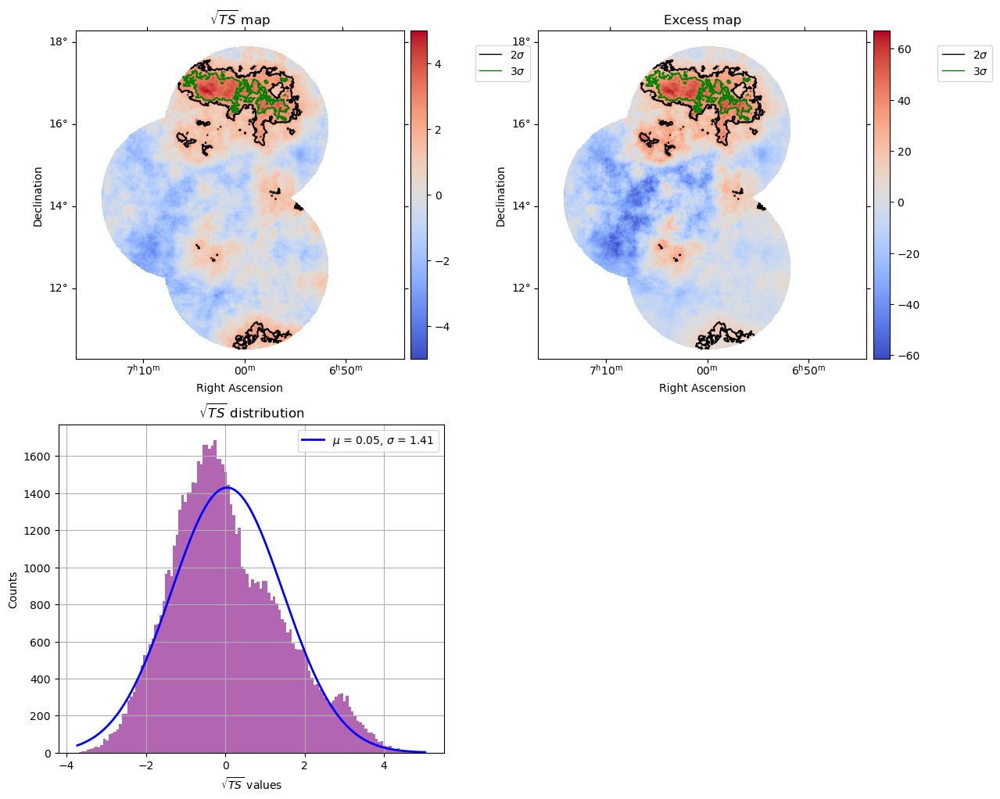

8 of 24 runs to analyse


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


Predicted to Total Counts Difference: 6.12 %
Counts/pixel for ON ID 165236: 5.12
Counts/pixel for OFF ID 173961: 4.68
Fractional run deviation 0.78


OFF ID: 173961, mu: -0.12, std: 1.03, excess: 4.47
ON ID: 165236, mu: -0.04, std: 1.07, excess: 53.36


Norm: 1.152, Tilt: 0.069
R.A.: 103.35 deg, Dec: 14.24 deg


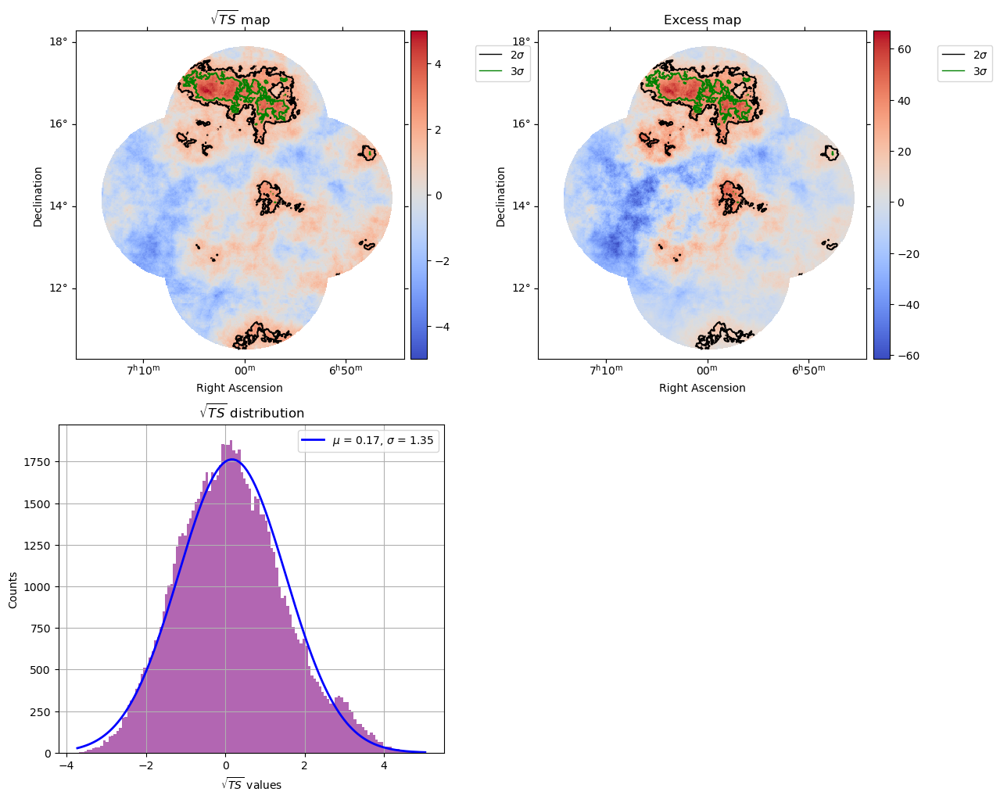

9 of 24 runs to analyse


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


Predicted to Total Counts Difference: 0.57 %
Counts/pixel for ON ID 165271: 7.54
Counts/pixel for OFF ID 173825: 7.97
Fractional run deviation 0.79


OFF ID: 173825, mu: -0.09, std: 1.02, excess: 19.25
ON ID: 165271, mu: -0.1, std: 1.03, excess: 6.84


Norm: 1.071, Tilt: -0.001
R.A.: 104.95 deg, Dec: 12.54 deg


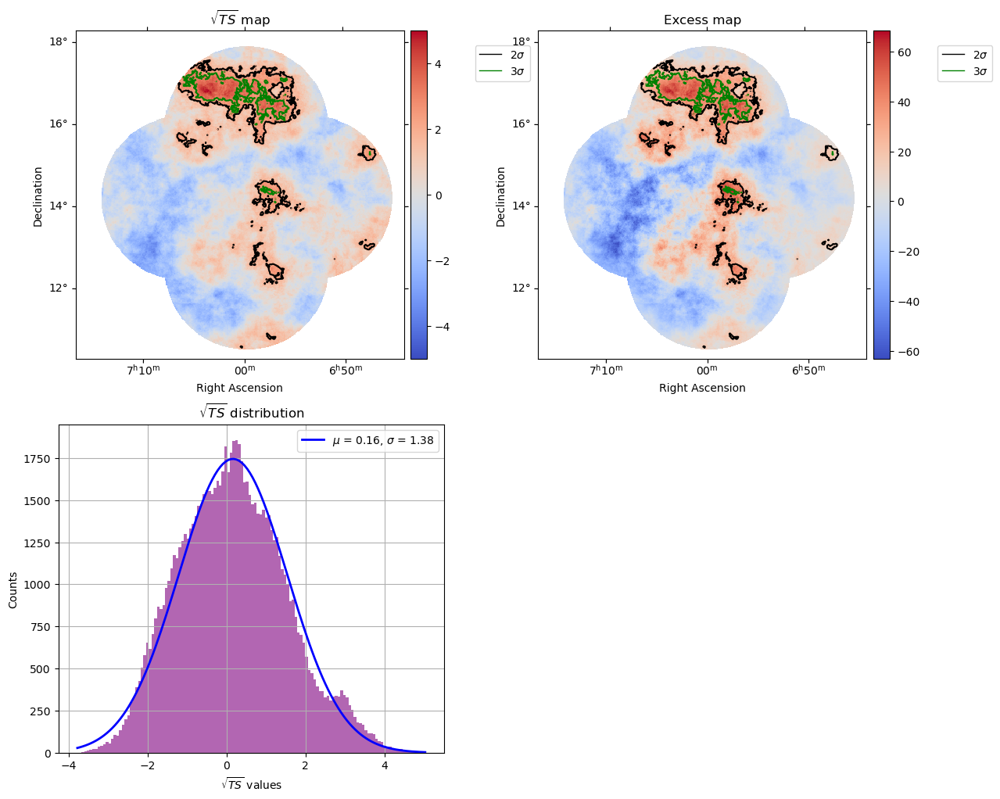

10 of 24 runs to analyse


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


Predicted to Total Counts Difference: 3.2 %
Counts/pixel for ON ID 165272: 8.07
Counts/pixel for OFF ID 168578: 7.12
Fractional run deviation 0.66


OFF ID: 168578, mu: -0.12, std: 1.04, excess: 8.44
ON ID: 165272, mu: -0.05, std: 1.03, excess: 40.31


Norm: 1.071, Tilt: -0.035
R.A.: 104.95 deg, Dec: 12.54 deg


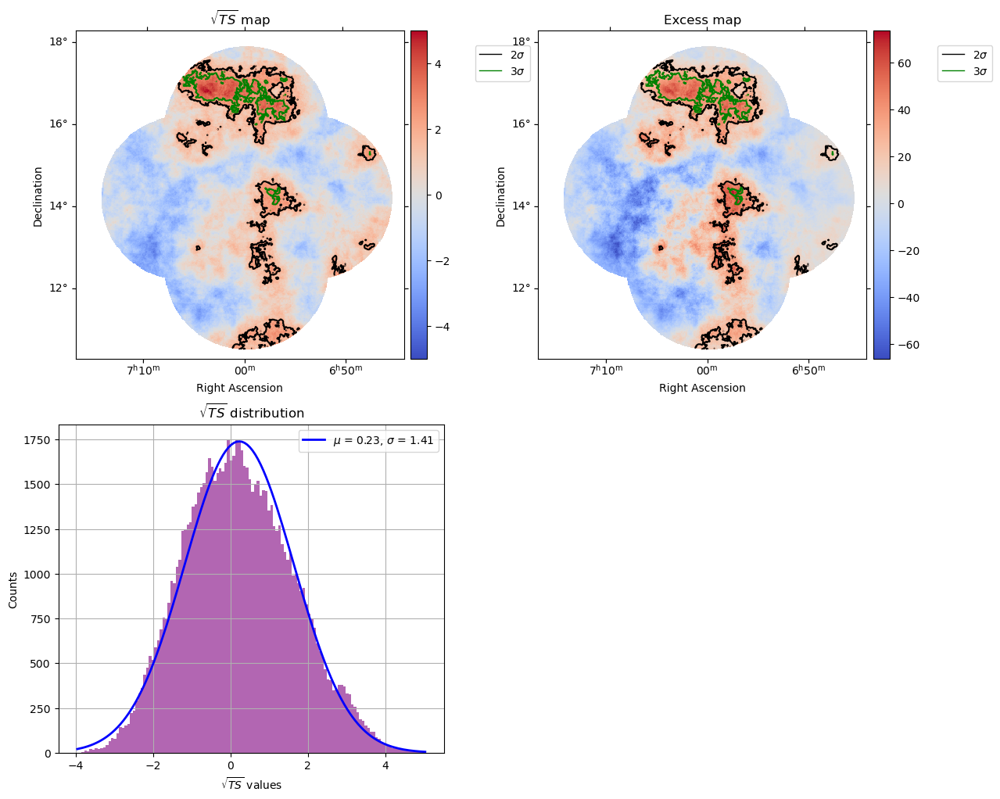

11 of 24 runs to analyse


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


Predicted to Total Counts Difference: 2.36 %
Counts/pixel for ON ID 165274: 3.04
Counts/pixel for OFF ID 170289: 2.55
Fractional run deviation 0.75


OFF ID: 170289, mu: -0.19, std: 1.08, excess: 5.75
ON ID: 165274, mu: -0.16, std: 1.08, excess: 14.63


Norm: 1.152, Tilt: -0.113
R.A.: 104.95 deg, Dec: 12.54 deg


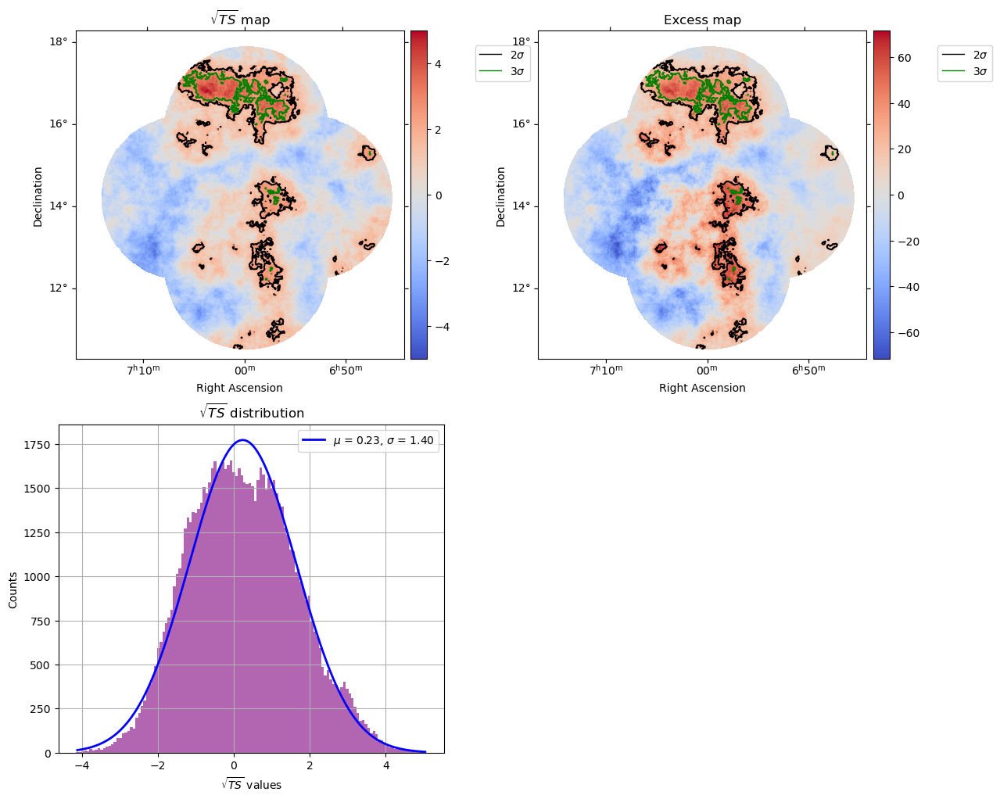

12 of 24 runs to analyse


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


Predicted to Total Counts Difference: 4.25 %
Counts/pixel for ON ID 165305: 4.95
Counts/pixel for OFF ID 170290: 3.54
Fractional run deviation 0.83


OFF ID: 170290, mu: -0.18, std: 1.07, excess: 0.11
ON ID: 165305, mu: -0.08, std: 1.07, excess: 36.74


Norm: 1.155, Tilt: -0.082
R.A.: 104.95 deg, Dec: 15.94 deg


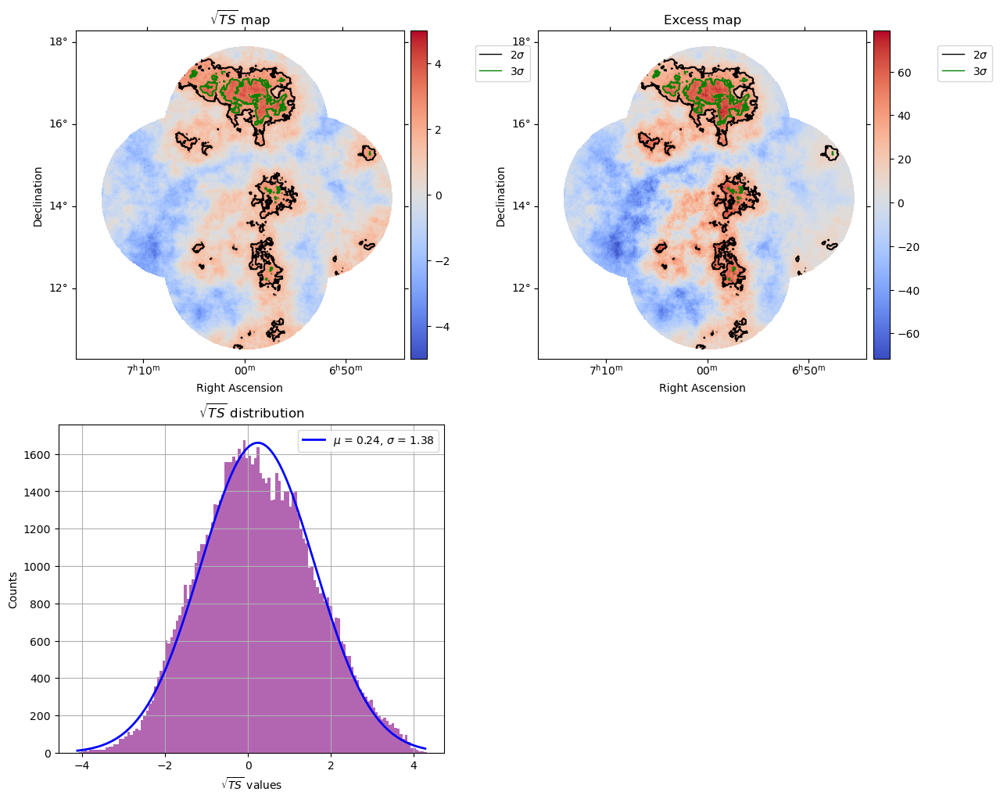

13 of 24 runs to analyse


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


Predicted to Total Counts Difference: 17.86 %
Counts/pixel for ON ID 165306: 2.77
Counts/pixel for OFF ID 183243: 2.53
Fractional run deviation 0.87


OFF ID: 183243, mu: -0.22, std: 1.08, excess: -4.23
ON ID: 165306, mu: -0.41, std: 1.03, excess: -121.97


Norm: 1.504, Tilt: 0.053
R.A.: 103.35 deg, Dec: 14.24 deg


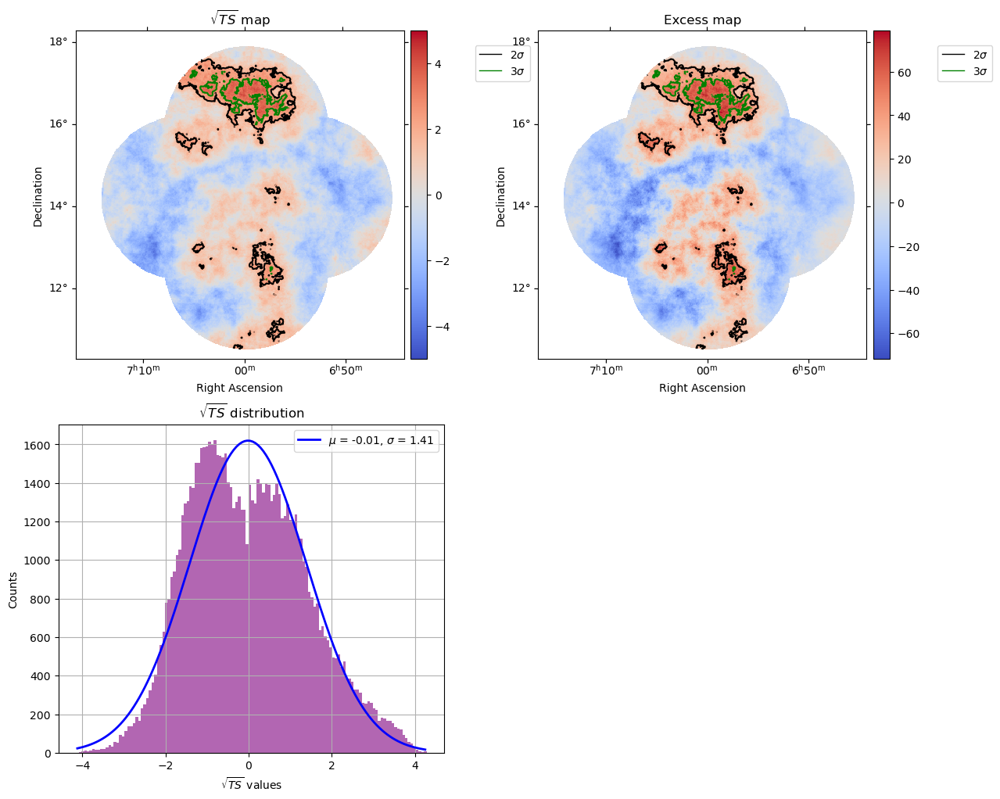

14 of 24 runs to analyse


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


Predicted to Total Counts Difference: 9.07 %
Counts/pixel for ON ID 165394: 7.25
Counts/pixel for OFF ID 169641: 7.92
Fractional run deviation 1.07


OFF ID: 169641, mu: -0.1, std: 1.03, excess: 14.44
ON ID: 165394, mu: -0.28, std: 1.02, excess: -112.97


Norm: 1.089, Tilt: -0.019
R.A.: 103.35 deg, Dec: 14.24 deg


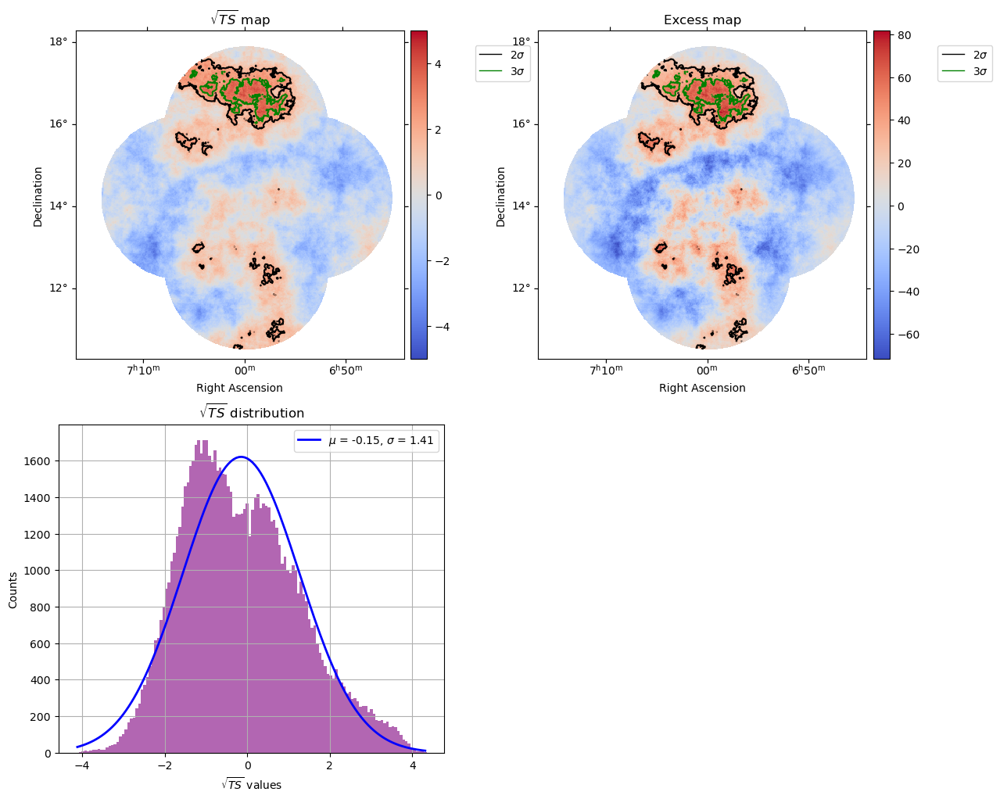

15 of 24 runs to analyse


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


Predicted to Total Counts Difference: 15.42 %
Counts/pixel for ON ID 165395: 4.61
Counts/pixel for OFF ID 183499: 4.56
Fractional run deviation 0.93


OFF ID: 183499, mu: -0.14, std: 1.08, excess: 9.27
ON ID: 165395, mu: -0.39, std: 1.03, excess: -154.05


Norm: 1.309, Tilt: -0.012
R.A.: 103.35 deg, Dec: 14.24 deg


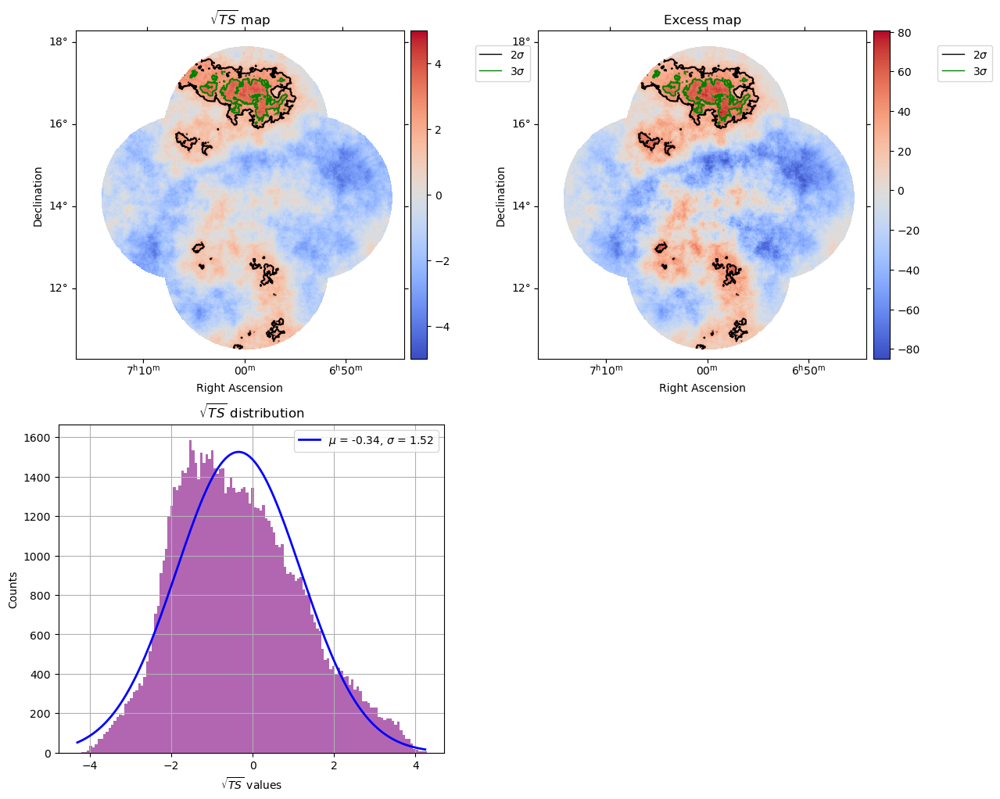

16 of 24 runs to analyse


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


Predicted to Total Counts Difference: 3.15 %
Counts/pixel for ON ID 165398: 3.1
Counts/pixel for OFF ID 169010: 2.78
Fractional run deviation 0.52


OFF ID: 169010, mu: -0.19, std: 1.08, excess: -3.23
ON ID: 165398, mu: -0.14, std: 1.07, excess: 19.13


Norm: 1.258, Tilt: 0.034
R.A.: 104.95 deg, Dec: 12.54 deg


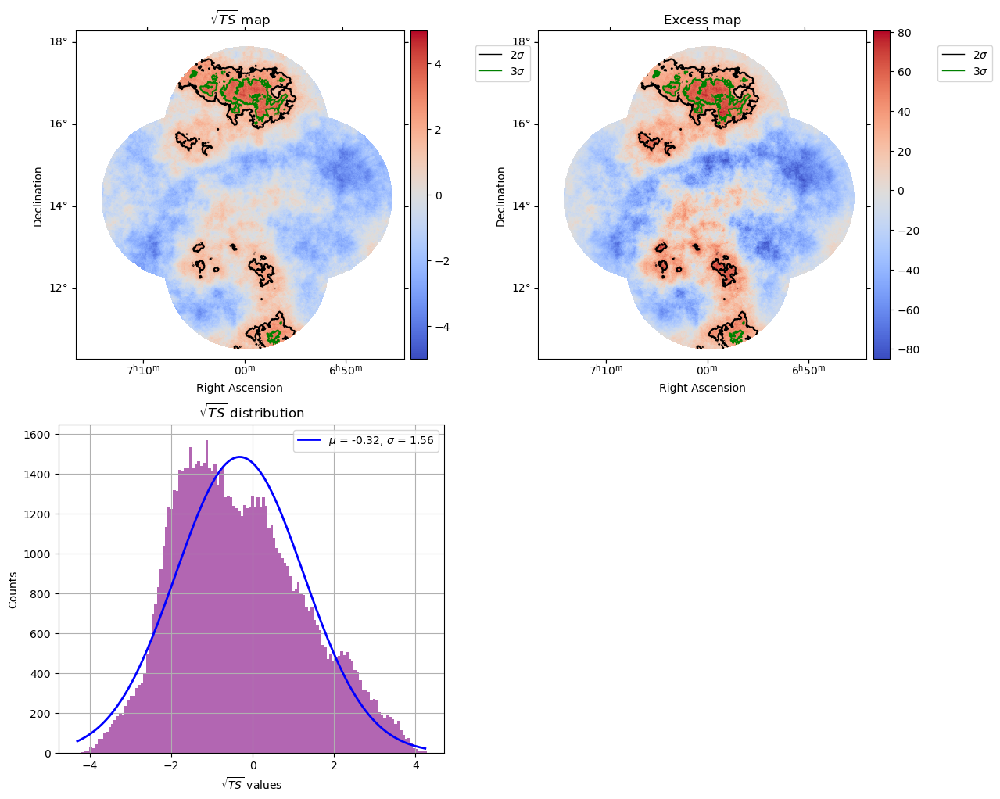

17 of 24 runs to analyse


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


Predicted to Total Counts Difference: 19.89 %
Counts/pixel for ON ID 165423: 7.61
Counts/pixel for OFF ID 183499: 8.26
Fractional run deviation 0.93


OFF ID: 183499, mu: -0.1, std: 1.05, excess: 14.44
ON ID: 165423, mu: -0.51, std: 1.05, excess: -300.96


Norm: 1.315, Tilt: -0.005
R.A.: 106.55 deg, Dec: 14.24 deg


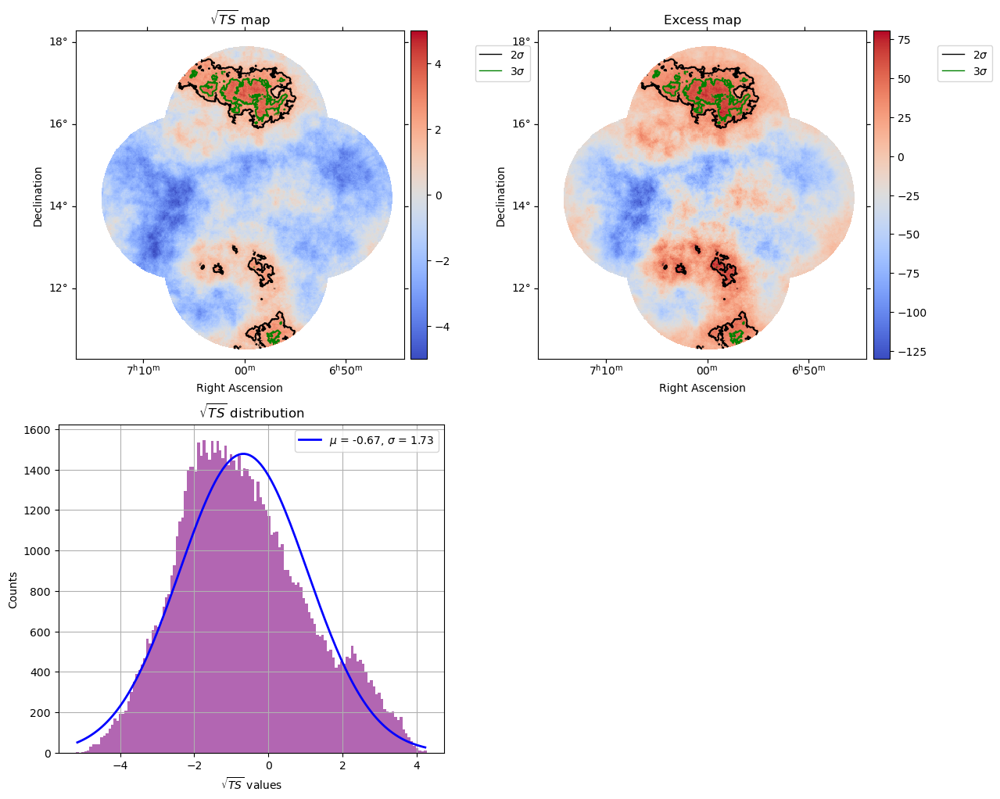

18 of 24 runs to analyse


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


Predicted to Total Counts Difference: 11.66 %
Counts/pixel for ON ID 165425: 2.51
Counts/pixel for OFF ID 170289: 2.55
Fractional run deviation 0.88


OFF ID: 170289, mu: -0.19, std: 1.08, excess: 5.75
ON ID: 165425, mu: -0.33, std: 1.02, excess: -67.82


Norm: 1.152, Tilt: -0.113
R.A.: 106.55 deg, Dec: 14.24 deg


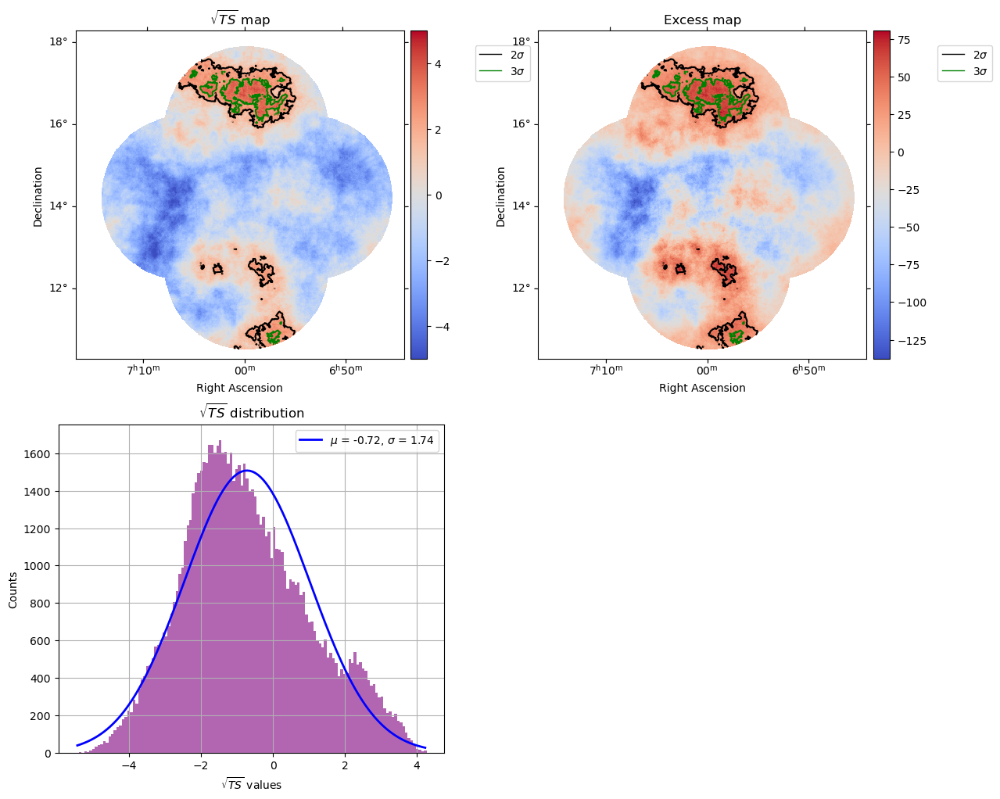

19 of 24 runs to analyse


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


Predicted to Total Counts Difference: 12.83 %
Counts/pixel for ON ID 172067: 7.86
Counts/pixel for OFF ID 171090: 8.82
Fractional run deviation 0.28


OFF ID: 171090, mu: -0.12, std: 1.08, excess: -4.62
ON ID: 172067, mu: -0.35, std: 1.04, excess: -185.43


Norm: 1.19, Tilt: -0.094
R.A.: 103.35 deg, Dec: 14.24 deg


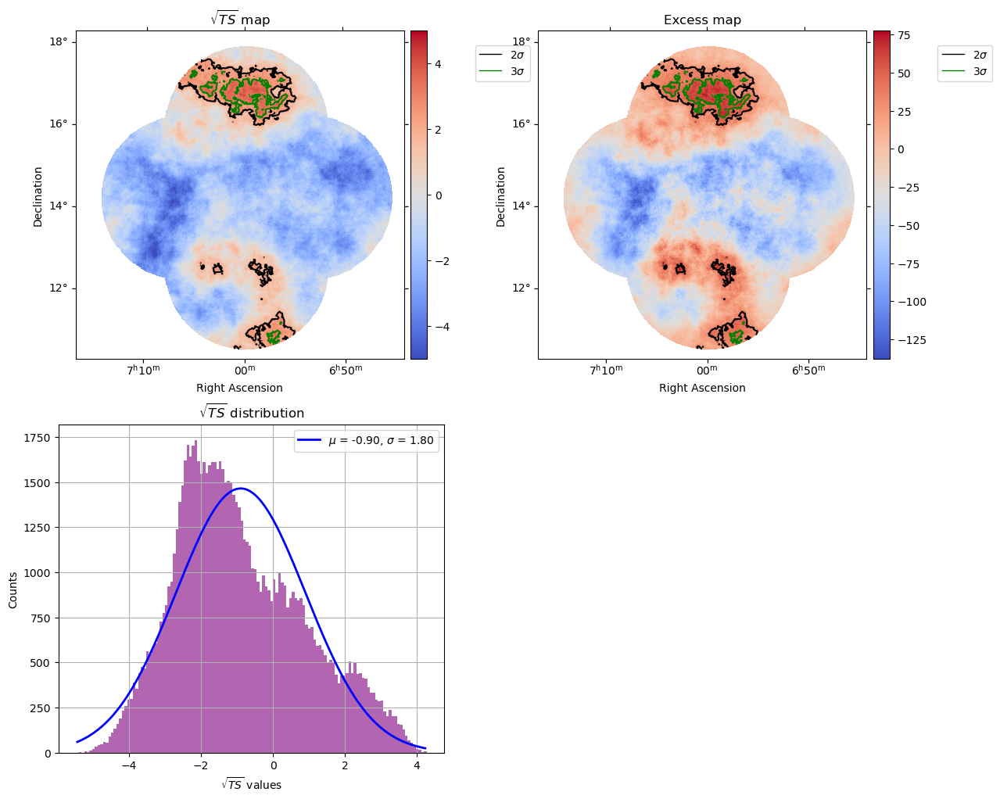

20 of 24 runs to analyse


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


Predicted to Total Counts Difference: 17.53 %
Counts/pixel for ON ID 172090: 7.45
Counts/pixel for OFF ID 170390: 8.97
Fractional run deviation 0.28


OFF ID: 170390, mu: -0.14, std: 1.08, excess: -4.74
ON ID: 172090, mu: -0.46, std: 1.01, excess: -251.19


Norm: 1.2, Tilt: -0.047
R.A.: 103.35 deg, Dec: 14.24 deg


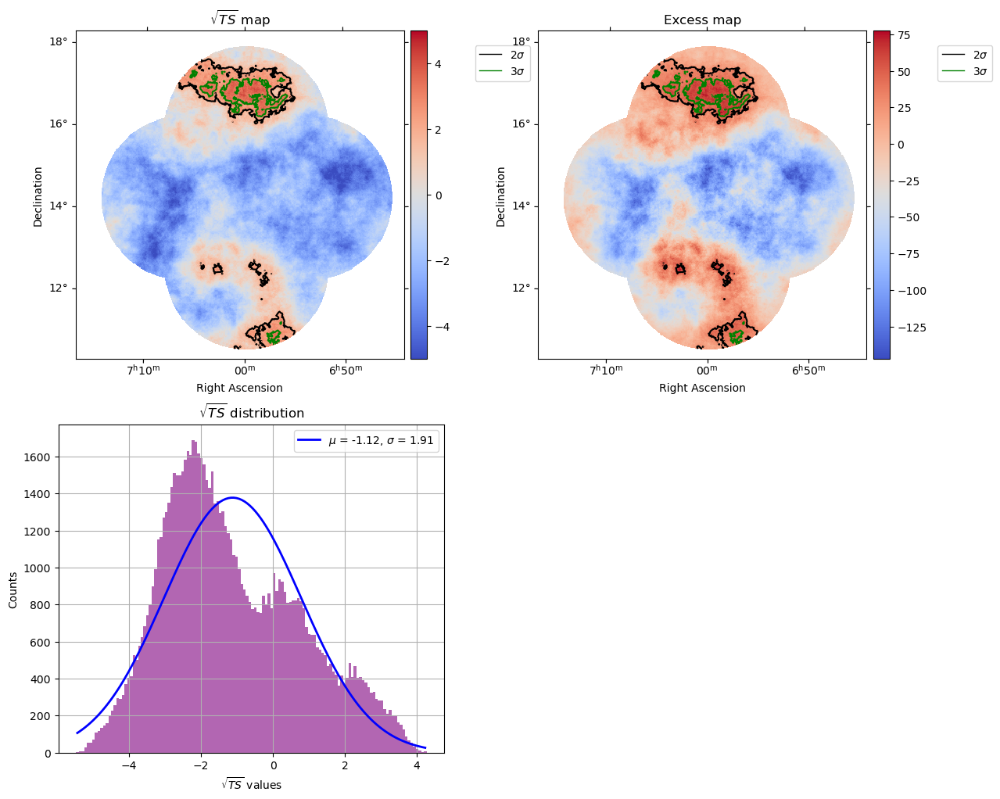

21 of 24 runs to analyse


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


Predicted to Total Counts Difference: 13.48 %
Counts/pixel for ON ID 172154: 7.32
Counts/pixel for OFF ID 170226: 8.8
Fractional run deviation 0.26


OFF ID: 170226, mu: -0.11, std: 1.01, excess: -4.61
ON ID: 172154, mu: -0.37, std: 1.02, excess: -181.08


Norm: 1.153, Tilt: -0.087
R.A.: 104.95 deg, Dec: 12.54 deg


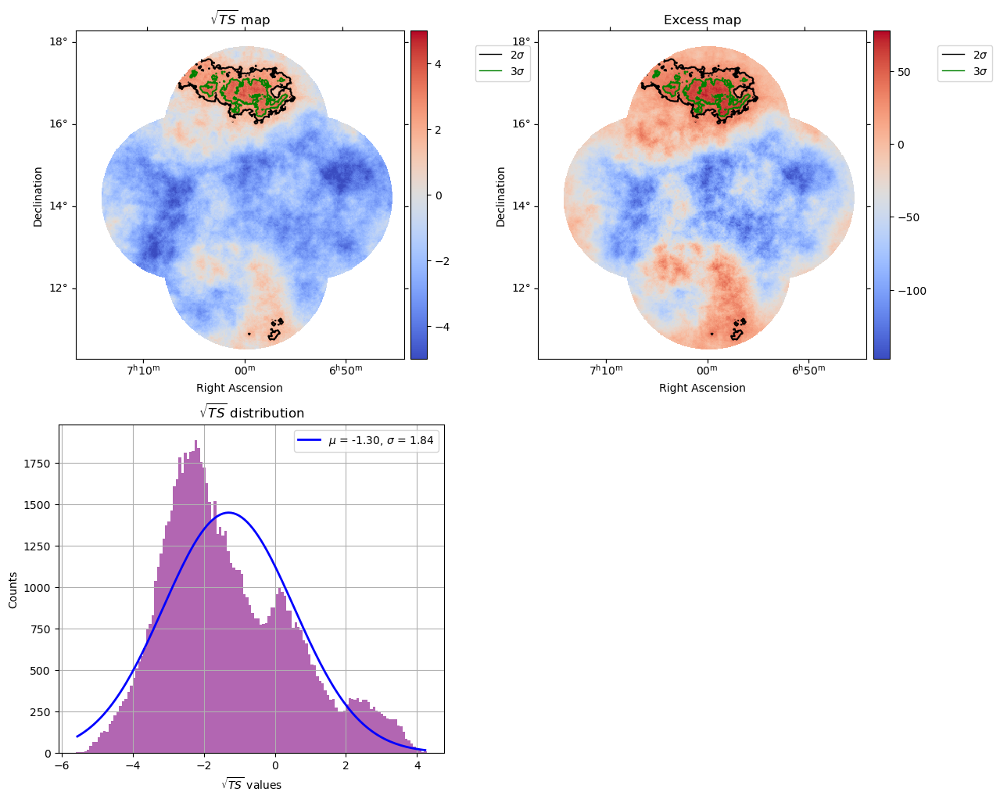

22 of 24 runs to analyse


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


Predicted to Total Counts Difference: 11.92 %
Counts/pixel for ON ID 172155: 7.99
Counts/pixel for OFF ID 170390: 8.97
Fractional run deviation 0.26


OFF ID: 170390, mu: -0.14, std: 1.08, excess: -4.74
ON ID: 172155, mu: -0.34, std: 0.99, excess: -172.8


Norm: 1.2, Tilt: -0.047
R.A.: 104.95 deg, Dec: 15.94 deg


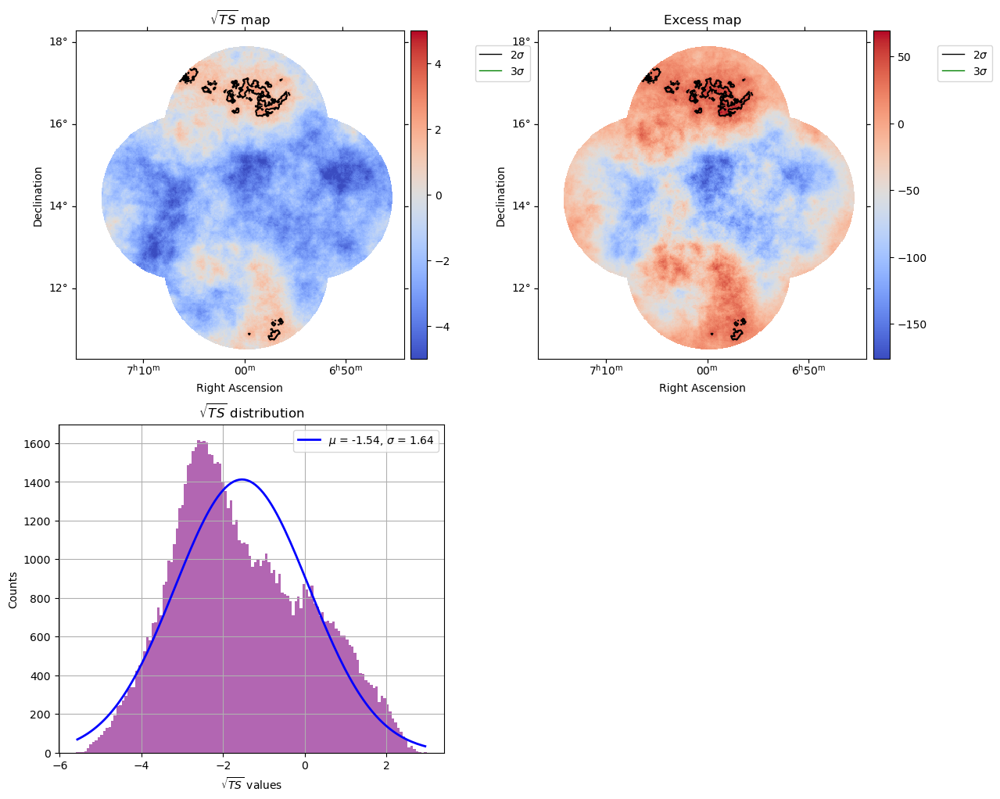

23 of 24 runs to analyse


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


Predicted to Total Counts Difference: 22.25 %
Counts/pixel for ON ID 172156: 2.28
Counts/pixel for OFF ID 165949: 2.98
Fractional run deviation 0.29


OFF ID: 165949, mu: -0.16, std: 1.04, excess: 9.16
ON ID: 172156, mu: -0.46, std: 1.0, excess: -130.47


Norm: 1.224, Tilt: -0.018
R.A.: 106.55 deg, Dec: 14.24 deg


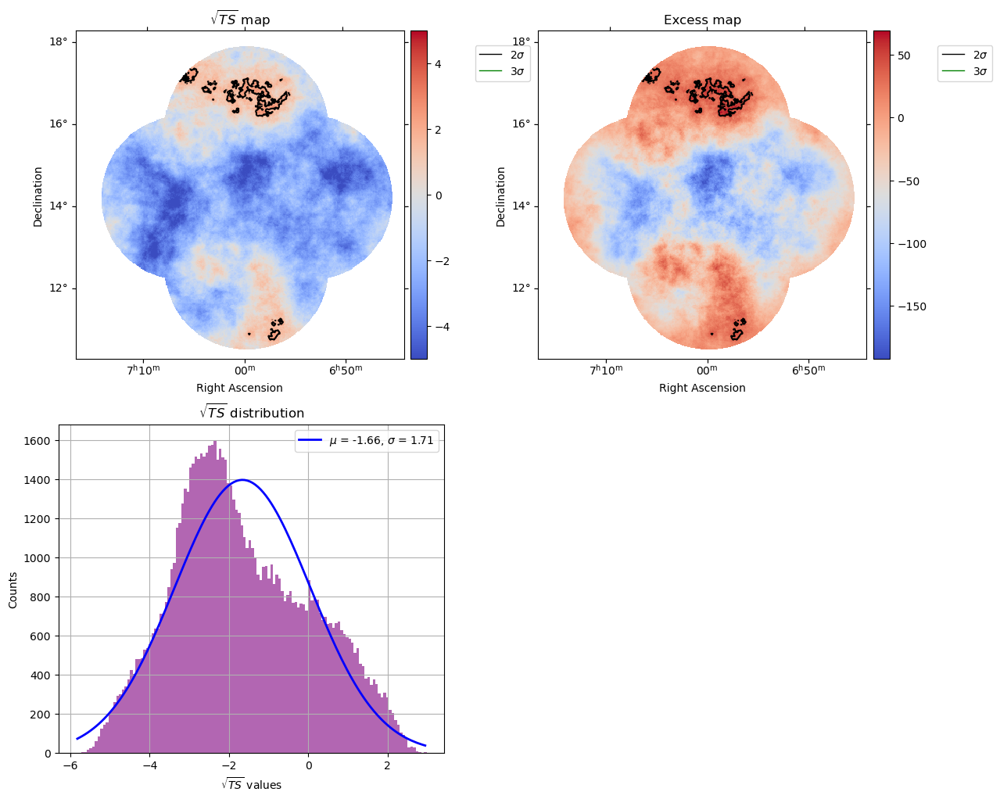

24 of 24 runs to analyse


Missing 'HDUCLAS2' keyword assuming 'BKG'
Missing 'HDUCLAS2' keyword assuming 'BKG'


Predicted to Total Counts Difference: 4.14 %
Counts/pixel for ON ID 172200: 2.53
Counts/pixel for OFF ID 170389: 3.37
Fractional run deviation 0.32


OFF ID: 170389, mu: -0.16, std: 1.06, excess: 3.41
ON ID: 172200, mu: -0.13, std: 1.05, excess: 20.49


Norm: 1.043, Tilt: 0.033
R.A.: 103.35 deg, Dec: 14.24 deg


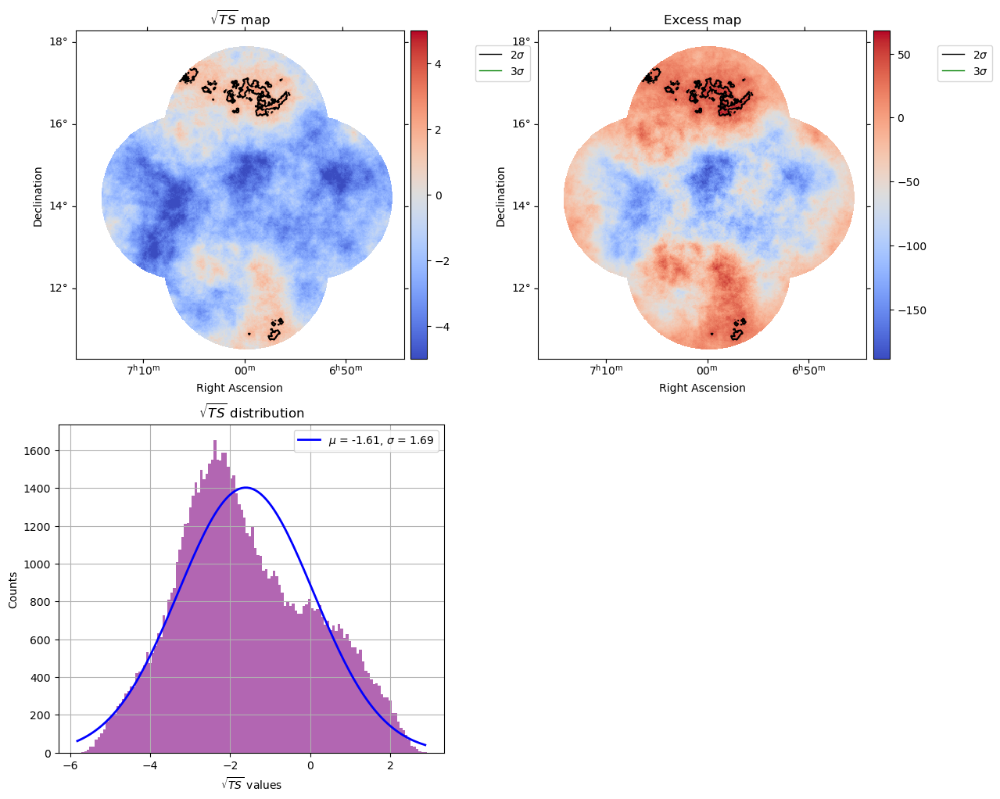

In [2301]:
sig_dist = []

on_runs_5_percent = []
on_runs_10_percent = []
on_runs_15_percent = []

off_runs_5_percent = []
off_runs_10_percent = []
off_runs_15_percent = []

stacked_name = f'Monogem_stacked_Dataset'
stacked = MapDataset.create(geom=geom, name=stacked_name, energy_axis_true=energy_axis_true)

stacked_name_5_percent_runs = f'Monogem_stacked_Dataset_5_percent_runs'
stacked_5_percent_runs = MapDataset.create(geom=geom, name=stacked_name_5_percent_runs, energy_axis_true=energy_axis_true)

stacked_name_10_percent_runs = f'Monogem_stacked_Dataset_10_percent_runs'
stacked_10_percent_runs = MapDataset.create(geom=geom, name=stacked_name_10_percent_runs, energy_axis_true=energy_axis_true)

stacked_name_15_percent_runs = f'Monogem_stacked_Dataset_15_percent_runs'
stacked_15_percent_runs = MapDataset.create(geom=geom, name=stacked_name_15_percent_runs, energy_axis_true=energy_axis_true)

tilt_list = []
norm_list = []

observations_top = []
observations_left = []
observations_right = []
observations_bottom = []

Table_bkg_fit_data = {'Tilt': [], 'Tilt_error': [], 'Norm': [], 'Norm_error': []}

print(f'{len(obs_list_on)} runs to analyse!')

for m in range(len(obs_list_on)):
    print(f'{m+1} of {len(obs_list_on)} runs to analyse')
    obs = obs_list_on[m]
    off_run = obs_list_off[m]
    dev = deviation[m]
    
    # ON run dataset geometry 
    cutout = stacked.cutout(obs.pointing.fixed_icrs, width=2*offset_max, name=f"obs-{obs.obs_id}")
    dataset = maker.run(cutout, obs)
    dataset = maker_safe_mask2.run(dataset, obs)   
    
    number_on = find_energy_threshold(dataset)
    
    # OFF run dataset geometry:
    geom_off = WcsGeom.create(skydir=off_run.pointing.fixed_icrs, binsz=0.02, width=FoV_width, frame="icrs", proj="CAR", axes=[energy_axis])
    
    stacked_off = MapDataset.create(geom=geom_off, name=f"obs-{off_run.obs_id}", energy_axis_true= energy_axis_true)
    cutout_off = stacked_off.cutout(off_run.pointing.fixed_icrs, width=2*offset_max, name=f"obs-{off_run.obs_id}")
    
    #define exclusion region and safe mask for the background fit
    maker_fov_off, ex = get_exclusion_mask(off_run, geom_off, 10, radius_source_mask=.3)
    
    #fit the background to the OFF run
    dataset_off = maker.run(cutout_off, off_run)
    dataset_off = maker_safe_mask2.run(dataset_off, off_run)
    
    number_off = find_energy_threshold(dataset_off)
    
    #find the highest energy threshold between ON and OFF run
    number = max(number_on, number_off)
    
    # apply the energy threshold to both ON and OFF run
    dataset.background = adjust_energy_threshold(dataset.background, number)
    dataset.counts = adjust_energy_threshold(dataset.counts, number)
    dataset_off.background = adjust_energy_threshold(dataset_off.background, number)
    dataset_off.counts = adjust_energy_threshold(dataset_off.counts, number)
    
    #The background fit
    bkg_model_off = FoVBackgroundModel(dataset_name=dataset_off.name)
    dataset_off.models=bkg_model_off
    dataset_off.background_model.spectral_model.tilt.frozen = False
    dataset_off = maker_fov_off.run(dataset_off)
    
    
    bkg_model_on = FoVBackgroundModel(dataset_name=dataset.name)
    dataset.models=bkg_model_on
    
    dataset.background_model.spectral_model.norm.value = dataset_off.background_model.spectral_model.norm.value
    dataset.background_model.spectral_model.tilt.value = dataset_off.background_model.spectral_model.tilt.value
    #dataset.background_model.spectral_model.reference.value = dataset_off.background_model.spectral_model.reference.value
    
    dataset.background_model.spectral_model.norm.frozen = True
    dataset.background_model.spectral_model.tilt.frozen = True
    
    tilt_list.append(dataset.background_model.spectral_model.tilt.value)
    norm_list.append(dataset.background_model.spectral_model.norm.value)
    
    # Apply the corrections
    dataset = livetime_corr(obs, off_run, dataset)
    dataset = zenith_corr(obs, off_run, dataset)
    
    Table_bkg_fit_data['Tilt'].append(dataset.background_model.spectral_model.tilt.value)    
    Table_bkg_fit_data['Tilt_error'].append(dataset.background_model.spectral_model.tilt.error) 
    Table_bkg_fit_data['Norm'].append(dataset.background_model.spectral_model.norm.value)    
    Table_bkg_fit_data['Norm_error'].append(dataset.background_model.spectral_model.norm.error) 
    
    obs_id = obs.obs_id
    obs_id_off = off_run.obs_id
    excess_vals_on = dataset.info_dict()['excess']
    excess_vals_off = dataset_off.info_dict()['excess']
    
    #Significance of the model:
    estimator_001 = ExcessMapEstimator(correlation_radius="0.1 deg")
    lima_maps_001 = estimator_001.run(dataset_off)
    
    significance_map = lima_maps_001["sqrt_ts"] 
    significance_off = significance_map.data[np.isfinite(significance_map.data)]
    mu, std = norm.fit(significance_off)
    mu = np.round(mu,3)
    std = np.round(std,3)
    
    estimator_002 = ExcessMapEstimator(correlation_radius="0.1 deg")
    lima_maps_002 = estimator_002.run(dataset)
    
    significance_map_on = lima_maps_002["sqrt_ts"] 
    significance_on = significance_map_on.data[np.isfinite(significance_map_on.data)]
    mu_on, std_on = norm.fit(significance_on)
    mu_on = np.round(mu_on,3)
    std_on = np.round(std_on,3)
    
    counts_on_ppx = np.mean(dataset.counts.data / np.sqrt(dataset.counts.geom.bin_volume())) * u.TeV**.5 * u.sr**.5
    counts_off_ppx = np.mean(dataset_off.counts.data / np.sqrt(dataset_off.counts.geom.bin_volume())) * u.TeV**.5 * u.sr**.5

    pixel_diff = np.abs(counts_on_ppx - counts_off_ppx)

    total_counts = dataset.info_dict()['counts']
    predicted_total_counts = dataset.info_dict()['npred']

    difference_between_runs = np.abs(predicted_total_counts - total_counts)/predicted_total_counts * 100

    print(f'Predicted to Total Counts Difference: {round(difference_between_runs,2)} %')
    
    print(f'Counts/pixel for ON ID {obs_id}: {round(float(counts_on_ppx),2)}')
    print(f'Counts/pixel for OFF ID {obs_id_off}: {round(float(counts_off_ppx),2)}')
    print(f'Fractional run deviation {round(dev,2)}')
    print('\n')
    print(f'OFF ID: {obs_id_off}, mu: {round(float(mu),2)}, std: {round(float(std),2)}, excess: {round(excess_vals_off,2)}')
    print(f'ON ID: {obs_id}, mu: {round(float(mu_on),2)}, std: {round(float(std_on),2)}, excess: {round(excess_vals_on,2)}')
    print('\n')
    print(f'Norm: {round(dataset.background_model.spectral_model.norm.value, 3)}, Tilt: {round(dataset.background_model.spectral_model.tilt.value, 3)}')
    print(f'R.A.: {round(obs.pointing.fixed_icrs.ra.value,2)} deg, Dec: {round(obs.pointing.fixed_icrs.dec.value,2)} deg')
    
    sig_dist.append((obs_id, obs_id_off, mu, std, excess_vals_off, mu_on, std_on, excess_vals_on, dev, np.mean(significance_off)))

    if obs.pointing.fixed_icrs.dec.value < 13:
        observations_bottom.append((obs.obs_id, off_run.obs_id, round(dev,3), excess_vals_on, excess_vals_off, dataset.background_model.spectral_model.norm.value, dataset.background_model.spectral_model.tilt.value))

    if obs.pointing.fixed_icrs.dec.value > 15:
        observations_top.append((obs.obs_id, off_run.obs_id, round(dev,3), excess_vals_on, excess_vals_off, dataset.background_model.spectral_model.norm.value, dataset.background_model.spectral_model.tilt.value))

    if (obs.pointing.fixed_icrs.dec.value < 15) & (obs.pointing.fixed_icrs.dec.value > 13):
       if (obs.pointing.fixed_icrs.ra.value > 105):
           observations_left.append((obs.obs_id, off_run.obs_id, round(dev,3), excess_vals_on, excess_vals_off, dataset.background_model.spectral_model.norm.value, dataset.background_model.spectral_model.tilt.value))

    if (obs.pointing.fixed_icrs.dec.value < 15) & (obs.pointing.fixed_icrs.dec.value > 13):
       if (obs.pointing.fixed_icrs.ra.value < 105):
           observations_right.append((obs.obs_id, off_run.obs_id, round(dev,3), excess_vals_on, excess_vals_off, dataset.background_model.spectral_model.norm.value, dataset.background_model.spectral_model.tilt.value))

    stacked.stack(dataset)
    
    Excess_map_estimator = ExcessMapEstimator(correlation_radius=.6*u.deg)
    result = Excess_map_estimator.run(stacked)
    significance_map = result.sqrt_ts
    excess_map = result.npred_excess
    
    plt.figure(figsize=(14, 12))
    ax1 = plt.subplot(221, projection=significance_map.geom.wcs)
    ax2 = plt.subplot(222, projection=excess_map.geom.wcs)
    ax3 = plt.subplot(223)
    
    # Plot significance map
    significance_map.plot(ax=ax1, add_cbar=True, cmap='coolwarm', vmin=-5, vmax=5)
    sigma_levels = [2, 3]  # Contour levels for 2 and 3 sigma
    colors = ['black', 'green']  # Colors for the 2 and 3 sigma contours
    significance_array = np.squeeze(significance_map)
    contours = ax1.contour(significance_array, levels=sigma_levels, colors=colors, lw=0.05)
    contour_legend_2_sigma_contour = Line2D([0], [0], color=colors[0], lw=1, label=rf'{sigma_levels[0]}$\sigma$')
    contour_legend_3_sigma_contour = Line2D([0], [0], color=colors[1], lw=1, label=rf'{sigma_levels[1]}$\sigma$')
    ax1.legend(handles=[contour_legend_2_sigma_contour, contour_legend_3_sigma_contour], loc='center left', bbox_to_anchor=(1.2, 0.9))
    ax1.set_title(r'$\sqrt{TS}$ map')
    
    # Plot excess map
    ax2.set_title('Excess map')
    excess_map.plot(ax=ax2, add_cbar=True, cmap='coolwarm')
    contours = ax2.contour(significance_array, levels=sigma_levels, colors=colors)
    ax2.legend(handles=[contour_legend_2_sigma_contour, contour_legend_3_sigma_contour], loc='center left', bbox_to_anchor=(1.2, 0.9))
    
    # Plot TS distribution
    ax3.set_title(r'$\sqrt{TS}$ distribution')
    data = significance_map.data[np.isfinite(significance_map.data)]
    bins_ = np.linspace(np.min(data), np.max(data), 131)
    n, bins, _ = ax3.hist(data, bins=bins_, color='purple', alpha=0.6, lw=2)
    x_vals = 0.5 * (bins[:-1] + bins[1:])
    mu, std = norm.fit(data)
    y = norm.pdf(x_vals, mu, std) * sum(n * np.diff(bins))
    
    ax3.plot(x_vals, y, lw=2, color='blue', label=r"$\mu$ = {:.2f}, $\sigma$ = {:.2f}".format(mu, std))
    
    ax3.set_xlabel('$\sqrt{TS}$ values')
    ax3.set_ylabel('Counts')
    ax3.legend()
    ax3.grid()
    plt.show()

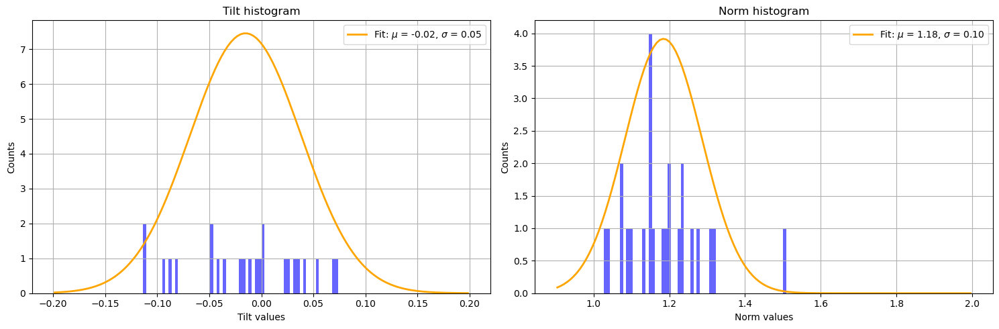

In [2303]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
# Tilt data
tilt_vals = tilt_list
bins_tilt_hist = np.linspace(-.2, .2, 131)
n_tilt, bins_tilt, _ = ax1.hist(tilt_vals, bins=bins_tilt_hist, color='blue', alpha=0.6, lw=2, zorder=1)

x_vals_tilt = 0.5 * (bins_tilt[:-1] + bins_tilt[1:])

mu, std = norm.fit(tilt_vals)

y = norm.pdf(x_vals_tilt,mu, std)

ax1.plot(x_vals_tilt, y, lw=2, color='orange', ls='solid', zorder=4,label=r"Fit: $\mu$ = {:.2f}, $\sigma$ = {:.2f}".format(mu, std))
ax1.set_xlabel('Tilt values')
ax1.set_ylabel('Counts')
ax1.legend()
ax1.grid()
ax1.set_title(f"Tilt histogram")

# Norm data
norm_vals = norm_list
bins_norm_hist = np.linspace(0.9, 2, 131)
n_norm, bins_norm, _ = ax2.hist(norm_vals, bins=bins_norm_hist, color='blue', alpha=0.6, lw=2, zorder=1)

x_vals_norm = 0.5 * (bins_norm[:-1] + bins_norm[1:])

mu_norm, std_norm = norm.fit(norm_vals)

y_norm = norm.pdf(x_vals_norm, mu_norm, std_norm)

ax2.plot(x_vals_norm, y_norm, lw=2, color='orange', ls='solid', zorder=4,label=r"Fit: $\mu$ = {:.2f}, $\sigma$ = {:.2f}".format(mu_norm, std_norm))
ax2.set_xlabel('Norm values')
ax2.set_ylabel('Counts')
ax2.legend()
ax2.grid()
ax2.set_title(f"Norm histogram")

plt.tight_layout()

# muf.save_figures('{}/THIS_ONE/'.format(PlotDir), name='monogem_42_matched_norm_and_tilt_histogram')

plt.show()

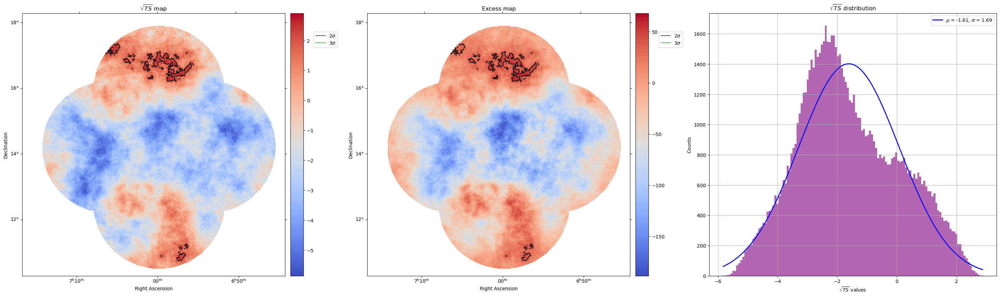

In [2304]:
Excess_map_estimator = ExcessMapEstimator(correlation_radius=.6*u.deg)
result = Excess_map_estimator.run(stacked)
significance_map = result.sqrt_ts
excess_map = result.npred_excess

plt.figure(figsize=(50, 10))
ax1 = plt.subplot(141, projection=significance_map.geom.wcs)
ax2 = plt.subplot(142, projection=excess_map.geom.wcs)
ax3 = plt.subplot(143)

# Plot significance map
significance_map.plot(ax=ax1, add_cbar=True, cmap='coolwarm')#, vmin=4, vmax=7)
sigma_levels = [2, 3]  # Contour levels for 2 and 3 sigma
colors = ['black', 'green']  # Colors for the 2 and 3 sigma contours
significance_array = np.squeeze(significance_map)
contours = ax1.contour(significance_array, levels=sigma_levels, colors=colors, lw=0.05)
contour_legend_2_sigma_contour = Line2D([0], [0], color=colors[0], lw=1, label=rf'{sigma_levels[0]}$\sigma$')
contour_legend_3_sigma_contour = Line2D([0], [0], color=colors[1], lw=1, label=rf'{sigma_levels[1]}$\sigma$')
ax1.legend(handles=[contour_legend_2_sigma_contour, contour_legend_3_sigma_contour], loc='center left', bbox_to_anchor=(1.1, 0.9))
ax1.set_title(r'$\sqrt{TS}$ map')

# Plot excess map
ax2.set_title('Excess map')
excess_map.plot(ax=ax2, add_cbar=True, cmap='coolwarm')
contours = ax2.contour(significance_array, levels=sigma_levels, colors=colors)
ax2.legend(handles=[contour_legend_2_sigma_contour, contour_legend_3_sigma_contour], loc='center left', bbox_to_anchor=(1.1, 0.9))

# Plot TS distribution
ax3.set_title(r'$\sqrt{TS}$ distribution')
data = significance_map.data[np.isfinite(significance_map.data)]
bins_ = np.linspace(np.min(data), np.max(data), 131)
n, bins, _ = ax3.hist(data, bins=bins_, color='purple', alpha=0.6, lw=2)
x_vals = 0.5 * (bins[:-1] + bins[1:])
mu, std = norm.fit(data)
y = norm.pdf(x_vals, mu, std) * sum(n * np.diff(bins))

ax3.plot(x_vals, y, lw=2, color='blue', label=r"$\mu$ = {:.2f}, $\sigma$ = {:.2f}".format(mu, std))

ax3.set_xlabel('$\sqrt{TS}$ values')
ax3.set_ylabel('Counts')
ax3.legend()
ax3.grid()

#muf.save_figures('{}/THIS_ONE'.format(PlotDir), name='52_matched')

plt.show()

In [2305]:
directions = [observations_top, observations_left, observations_right, observations_bottom]

for obs_dir in directions:
    print('\n')
    print(f'{len(obs_dir)} runs:')
    print('On Id:', [item[0] for item in obs_dir])
    print('Off Id:', [item[1] for item in obs_dir])
    print('Deviation:', [item[2] for item in obs_dir])
    deviation_vals = []
    deviation_vals.append([item[2] for item in obs_dir])
    print('Excess values On Id:', [round(item[3],2) for item in obs_dir])
    excess_on = []
    excess_on.append([item[3] for item in obs_dir])
    print('Excess values Off Id:', [round(item[4],2) for item in obs_dir])
    print('Norm:', [round(item[5],2) for item in obs_dir])
    norm_vals = []
    norm_vals.append([round(item[5],2) for item in obs_dir])
    print('Tilt:', [round(item[6],2) for item in obs_dir])
    tilt_vals = []
    tilt_vals.append([round(item[6],2) for item in obs_dir])
    print(f'Mean Norm: {round(np.mean(norm_vals),2)}, Mean Tilt: {round(np.mean(tilt_vals),2)}')



5 runs:
On Id: [165193, 165197, 165199, 165305, 172155]
Off Id: [166897, 171693, 173961, 170290, 170390]
Deviation: [0.58, 0.9, 0.896, 0.835, 0.262]
Excess values On Id: [161.24, 0.12, 34.77, 36.74, -172.8]
Excess values Off Id: [-4.03, 15.15, 0.43, 0.11, -4.74]
Norm: [1.24, 1.1, 1.03, 1.16, 1.2]
Tilt: [0.0, 0.02, -0.04, -0.08, -0.05]
Mean Norm: 1.15, Mean Tilt: -0.03


6 runs:
On Id: [165164, 165166, 165168, 165423, 165425, 172156]
Off Id: [170316, 169010, 171694, 183499, 170289, 165949]
Deviation: [0.706, 0.552, 0.854, 0.928, 0.883, 0.292]
Excess values On Id: [-19.13, -228.18, 72.82, -300.96, -67.82, -130.47]
Excess values Off Id: [2.37, 4.02, -0.19, 14.44, 5.75, 9.16]
Norm: [1.13, 1.27, 1.19, 1.31, 1.15, 1.22]
Tilt: [0.02, 0.04, 0.07, -0.01, -0.11, -0.02]
Mean Norm: 1.21, Mean Tilt: -0.0


7 runs:
On Id: [165236, 165306, 165394, 165395, 172067, 172090, 172200]
Off Id: [173961, 183243, 169641, 183499, 171090, 170390, 170389]
Deviation: [0.78, 0.871, 1.067, 0.926, 0.277, 0.277, 0.3

In [2306]:
print('\n')
print('Stop')
print('\n')



Stop


